# SQL資料更新

In [1]:
####################################################################################################
#瘋狗流裝包
####################################################################################################
import pandas as pd
import numpy as np
import pyodbc
import warnings 
import warnings
warnings.filterwarnings("ignore")
from datetime import timedelta
import datetime
from interval3 import Interval, IntervalSet
from tqdm import tqdm
from scipy import stats
from importlib import reload
pd.set_option('display.max_rows', 150)
pd.set_option('display.max_columns', 150)
from sqlalchemy import create_engine
from sklearn.linear_model import LinearRegression
from matplotlib import pyplot as plt
from scipy import stats
from scipy import stats
from scipy.stats.mstats import winsorize
import os
warnings.filterwarnings("ignore")

from matplotlib.font_manager import FontProperties
# myfont=FontProperties(fname=r'C:\Users\chiehlinchen\Desktop\msj.ttf',size=14)
# # sns.set(font=myfont.get_family(), rc={'figure.figsize':(5,4)}, font_scale= 2)
# # sns.set_style("whitegrid",{"font.sans-serif":['Microsoft JhengHei']})
# plt.rcParams['font.sans-serif'] = ['Microsoft JhengHei']
# plt.rcParams['axes.unicode_minus'] =False
plt.rcParams['axes.facecolor']='whitesmoke'

import plotly.express as px

In [2]:
import pandas as pd 
import pyodbc
class get_df:

    def __init__(self):
        self.DB_infos = {'StrategyData': ('10.14.106.11','StrategyData','cc1102','cc1102')}
        self.querys = {}
        self.db = str()
        self.df_dict =  dict()
        self.w_code_dict = dict()
        self.point_dict = dict()
        self.result_dict = dict()
        
    def db_connect(self, DB_info):
        DB_Host, DB_Name, DB_User, DB_Password = self.DB_infos[DB_info]
        print("Connecting to database using pyodbc...")
        self.db = pyodbc.connect('DRIVER={ODBC Driver 13 for SQL Server}; SERVER=' + DB_Host + '; DATABASE=' + DB_Name + '; UID=' + DB_User + '; PWD=' + DB_Password)
        print("Succesfully Connected to database using pyodbc!")
      
    def load_data(self, query):
        df =  pd.read_sql(self.querys[query], self.db)
        return df

    @staticmethod
    def make_TCRI():
        df ="""SELECT  [STOCKID]
                      ,[TCRI]
                  FROM [StrategyData].[dbo].[TCRI]"""
        return df

In [3]:
sql_base = get_df()
sql_base.db_connect('StrategyData')
sql_base.querys['TCRI'] = get_df.make_TCRI()
df = sql_base.load_data('TCRI')
df['TCRI'] = df['TCRI'].str.strip()
df = df[~(df['TCRI'].isin(['D','C','7','8','9']))].sort_values(by = 'STOCKID').reset_index(drop = True)
#path = input()
#df.to_excel(path + "\\TCRI.xlsx")
df.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\TCRIDAY.xlsx',index = False)
df.to_excel(r'C:\Users\larryx30\Desktop\PYTHON\TCRIDAY.xlsx',index = False)

Connecting to database using pyodbc...
Succesfully Connected to database using pyodbc!


In [4]:
####################################################################################################
#接數據庫
####################################################################################################


class get_df:

    def __init__(self):
        self.DB_infos = {"X01" : ("192.168.1.16", "X01", "cm23357868", "86875332")}
        self.querys = {}
        self.db = str()
        self.df_dict =  dict()
        self.w_code_dict = dict()
        self.point_dict = dict()
        self.result_dict = dict()
        
    def db_connect(self, DB_info):
        DB_Host, DB_Name, DB_User, DB_Password = self.DB_infos[DB_info]
        print("Connecting to database using pyodbc...")
        self.db = pyodbc.connect('DRIVER={ODBC Driver 13 for SQL Server}; SERVER=' + DB_Host + '; DATABASE=' + DB_Name + '; UID=' + DB_User + '; PWD=' + DB_Password)
        print("Succesfully Connected to database using pyodbc!")
      
    def load_data(self, query):
        df =  pd.read_sql(self.querys[query], self.db)
        return df
    
    @staticmethod
    def make_fitable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[資使用率]
                                    ,[融資維持率(%)]
                                    ,[當沖比率]
                                    FROM [X01].[dbo].[日融資券排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_stocktable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[開盤價]
                                    ,[最高價]
                                    ,[最低價]
                                    ,[收盤價]
                                    ,[成交金額(千)]
                                    ,[週轉率(%)]
                                    FROM [X01].[dbo].[日收盤表排行] WITH(NOLOCK)  where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_returntable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[還原收盤價]
                                    FROM [X01].[dbo].[日報酬率比較表] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and 日期 >= 20020101 order by 日期 """ 
        return sql_stock_price

    @staticmethod
    def make_toshintable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[投信買賣超金額(千)]
                                    ,[投信持股比率(%)]
                                    ,[投信持股市值(百萬)]
                                    ,[投信持股成本]
                                    FROM [X01].[dbo].[日投信明細與排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and  日期 >= 20020101 order by 日期 """  
        return sql_stock_price

    @staticmethod
    def make_foregintable():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[外資買賣超金額(千)]
                                    ,[外資持股比率(%)]
                                    ,[外資持股市值(百萬)]
                                    ,[外資持股成本]
                                    FROM [X01].[dbo].[日外資持股與排行] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and  日期 >= 20020101 order by 日期 """ 
        return sql_stock_price
    @staticmethod
    def make_ETF():
        sql_stock_price = """SELECT  [日期]
                                    ,[標的代號]
                                FROM [X01].[dbo].[ETF持股明細表] where 日期 >= 20020101 order by 日期""" 
        return sql_stock_price
    @staticmethod
    def make_brokerage():
        sql_stock_price = """SELECT  [日期]
                                    ,[股票代號]
                                    ,[股票名稱]
                                    ,[買張1(券商)]
                                    ,[買張2(券商)]
                                    ,[買張3(券商)]
                                    ,[賣張1(券商)]
                                    ,[賣張2(券商)]
                                    ,[賣張3(券商)]
                                    FROM [X01].[dbo].[日券商分點排行Top15] WITH(NOLOCK) where (len(股票代號) = 4 or 股票代號 IN ('TWA00','910322','910861','911608','911622','911868','912000')) and  日期 >= 20020101 order by 日期 """ 
        
        return sql_stock_price

In [5]:
s_code_df = pd.read_excel(r'C:\Users\larryx30\Desktop\ALLSTOCK.xlsx')
stock_ls = list(s_code_df.loc[0:,'NUM'])

In [6]:
Sql_Base = get_df()
Sql_Base.db_connect('X01')

Connecting to database using pyodbc...
Succesfully Connected to database using pyodbc!


In [7]:
Sql_Base.querys['日融資券排行'] = get_df.make_fitable()
fitable = Sql_Base.load_data('日融資券排行')

Sql_Base.querys['日收盤表排行'] = get_df.make_stocktable()
stocktable = Sql_Base.load_data('日收盤表排行')

Sql_Base.querys['日報酬率比較表'] = get_df.make_returntable()
returntable = Sql_Base.load_data('日報酬率比較表')

Sql_Base.querys['日投信明細與排行'] = get_df.make_toshintable()
toshintable = Sql_Base.load_data('日投信明細與排行')

Sql_Base.querys['日外資持股與排行'] = get_df.make_foregintable()
foregintable = Sql_Base.load_data('日外資持股與排行')

Sql_Base.querys['日券商分點排行Top15'] = get_df.make_brokerage()
brokerage = Sql_Base.load_data('日券商分點排行Top15')

Sql_Base.querys['ETF持股明細表'] = get_df.make_ETF()
ETF = Sql_Base.load_data('ETF持股明細表')
ETF['是否為ETF成分股'] = 'E'
ETF = ETF.drop_duplicates().reset_index(drop = True)
ETF = ETF.rename(columns = {'標的代號':'股票代號'})

In [8]:
data_frame = stocktable.merge(fitable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(returntable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(toshintable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(foregintable, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(brokerage, on = ['日期','股票代號','股票名稱'], how = 'left').fillna(0)
data_frame = data_frame.merge(ETF,on = ['日期','股票代號'],how = 'left')
data_frame['是否為ETF成分股'] = data_frame['是否為ETF成分股'].fillna('F')
data_frame = data_frame[data_frame['股票代號'].isin(s_code_df['NUM'])]
data_frame['日期'] = pd.to_datetime(data_frame['日期'],format = "%Y%m%d").fillna(0)
data_frame = data_frame.set_index('日期')

data_dict = {str(stock_ls[i]):data_frame[data_frame['股票代號'] == stock_ls[i]] for i in tqdm(range(len(stock_ls)))}

feature_ls = data_frame.columns[2:]
data_frame = data_frame.reset_index(drop = False)
data_pivots_ls = []
for feature in tqdm(feature_ls):
    data_pivot = data_frame.pivot('日期','股票代號',feature)
    data_pivots_ls.append(data_pivot)
pivot_dict = {str(feature_ls[i]):data_pivots_ls[i] for i in range(len(feature_ls))}

data_dict.update(pivot_dict)

100%|██████████| 25/25 [01:03<00:00,  2.52s/it]


In [9]:
#data_dict.keys()

In [10]:
response1 = pd.read_excel(r'C:\Users\larryx30\Desktop\\ALLSTOCK.xlsx')
response1.index = response1.index+1
AS = response1['NUM']

response2 = pd.read_excel(r'C:\Users\larryx30\Desktop\PYTHON\TCRIDAY.xlsx')
response2.index = response2.index+1
SKTCRI = response2['STOCKID']
SKTCRI = SKTCRI.str.strip()
SKTCRI = SKTCRI[SKTCRI.isin(list(AS))]

response3 = pd.read_excel(r'C:\Users\larryx30\Desktop\STOCKFUTURE.xlsx')
response3.index = response3.index+1
SF = response3['NUM']

In [11]:
data_dict['2330']

,股票代號,股票名稱,開盤價,最高價,最低價,收盤價,成交金額(千),週轉率(%),資使用率,融資維持率(%),當沖比率,還原收盤價,投信買賣超金額(千),投信持股比率(%),投信持股市值(百萬),投信持股成本,外資買賣超金額(千),外資持股比率(%),外資持股市值(百萬),外資持股成本,買張1(券商),買張2(券商),買張3(券商),賣張1(券商),賣張2(券商),賣張3(券商),是否為ETF成分股
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,
2002-01-02,2330,台積電,87.5,88.0,84.5,86.0,3055293.0,0.20,3.12,0.000000,0.0,28.99,465269.0,0.49,7601.06,70.20,-509802.0,30.62,443351.48,60.38,0,0,0,0,0,0,F
2002-01-03,2330,台積電,87.5,87.5,85.0,85.5,3534679.0,0.23,2.87,0.000000,0.0,28.82,256322.0,0.50,7812.09,70.76,659791.0,30.67,441430.81,60.47,0,0,0,0,0,0,F
2002-01-04,2330,台積電,88.5,89.5,88.0,89.0,8046369.0,0.50,2.78,0.000000,0.0,30.00,349388.0,0.53,8482.09,71.51,3694402.0,30.91,463204.27,60.73,0,0,0,0,0,0,F
2002-01-07,2330,台積電,90.0,93.0,89.0,92.5,7316404.0,0.44,2.52,0.000000,0.0,31.18,236738.0,0.54,9057.36,72.19,3647013.0,31.15,485142.64,60.99,0,0,0,0,0,0,F
2002-01-08,2330,台積電,92.0,92.0,90.0,90.5,3394787.0,0.21,2.38,0.000000,0.0,30.51,88028.0,0.55,8949.31,72.45,409182.0,31.18,475061.13,61.07,0,0,0,0,0,0,F
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-12-06,2330,台積電,568.0,575.0,568.0,570.0,13197099.0,0.09,0.24,171.328201,0.0,570.00,-30264.0,0.65,96689.89,512.10,1141971.0,72.49,10715017.39,364.79,美商高盛,台灣匯立,元大,新加坡商瑞銀,元富,台灣摩根士丹利,E
2023-12-07,2330,台積電,570.0,573.0,566.0,566.0,13786126.0,0.09,0.24,170.064194,0.0,566.00,-171073.0,0.65,95840.98,512.10,-1451370.0,72.48,10638401.94,364.95,台灣摩根士丹利,新加坡商瑞銀,台灣匯立,新加坡商瑞銀,台灣匯立,元富,E
2023-12-08,2330,台積電,574.0,577.0,570.0,570.0,22520643.0,0.15,0.26,170.940094,0.0,570.00,-474013.0,0.65,96047.48,512.15,4537672.0,72.51,10718060.79,365.27,台灣摩根士丹利,凱基-台北,摩根大通,新加坡商瑞銀,元富,摩根大通,E


In [12]:
DDW = {}
for j in tqdm(AS):
    DDW[str(j)] = data_dict[str(j)].resample('W-FRI').agg({'開盤價':'first', '最高價':'max', '最低價':'min', '收盤價':'last','成交金額(千)':'sum',\
                                                           '資使用率':'last','當沖比率':'last','週轉率(%)':'last','融資維持率(%)':'last', '還原收盤價':'last'\
                                                           ,'投信持股比率(%)':'last','投信持股成本':'last','外資持股比率(%)':'last','外資持股成本':'last'\
                                                           ,'投信持股市值(百萬)':'last','是否為ETF成分股':'last','買張1(券商)':'last'\
                                                           ,'買張2(券商)':'last','買張3(券商)':'last','賣張1(券商)':'last','賣張2(券商)':'last','賣張3(券商)':'last'}).fillna(method = 'pad' ,axis = 0)
    


100%|██████████| 1776/1776 [00:40<00:00, 43.81it/s]


In [13]:
DDW['3231']

,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,當沖比率,週轉率(%),融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,買張1(券商),買張2(券商),買張3(券商),賣張1(券商),賣張2(券商),賣張3(券商)
日期,,,,,,,,,,,,,,,,,,,,,,
2003-08-22,34.2,37.3,34.2,34.8,1881226.0,0.000000,0.00,0.94,0.000000,6.34,0.21,35.83,0.28,36.46,59.68,F,0,0,0,0,0,0
2003-08-29,34.8,36.1,29.8,30.2,857329.0,0.000000,0.00,0.70,0.000000,5.51,0.50,35.32,10.39,35.01,121.86,F,0,0,0,0,0,0
2003-09-05,30.6,32.0,30.5,31.2,382750.0,0.000000,0.00,0.19,0.000000,5.69,0.50,34.66,10.35,35.01,126.30,F,0,0,0,0,0,0
2003-09-12,31.3,31.4,29.1,29.8,210813.0,0.000000,0.00,0.12,0.000000,5.43,0.47,34.66,10.35,35.01,114.67,F,0,0,0,0,0,0
2003-09-19,30.0,33.6,29.3,33.4,719143.0,0.000000,0.00,1.18,0.000000,6.09,0.60,33.56,10.76,34.95,162.19,F,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-11-17,99.0,101.5,97.6,99.0,37226589.0,16.320000,0.17,1.55,165.643005,99.00,6.10,87.40,31.44,100.19,17521.80,E,富邦-嘉義,凱基-台北,美林,美林,凱基-台北,富邦-嘉義
2023-11-24,99.5,104.0,95.1,96.0,34909338.0,15.360000,0.00,1.04,161.111603,96.00,5.89,87.88,29.78,100.11,16410.52,E,台灣摩根士丹利,凱基-復興,新加坡商瑞銀,元富,台灣摩根士丹利,美商高盛
2023-12-01,95.9,95.9,90.3,92.8,30030942.0,16.280001,0.10,2.54,157.656799,92.80,4.43,87.93,28.98,99.08,11908.26,E,新加坡商瑞銀,台灣摩根士丹利,美林,美商高盛,富邦,新加坡商瑞銀


# 計算大盤夏普

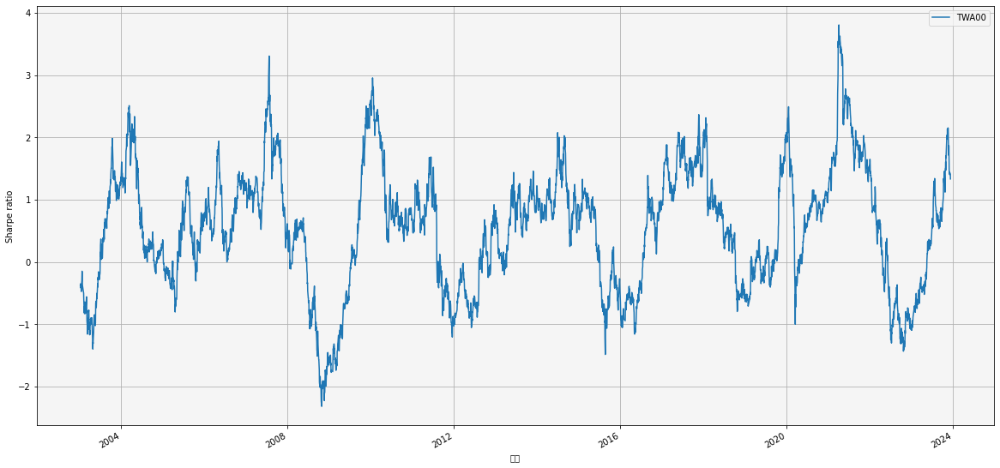

In [14]:
import matplotlib.pyplot as plt
import mplfinance as mpf
import seaborn as sns
shar2 = pd.DataFrame()

change2 = data_dict["TWA00"]["還原收盤價"].pct_change()
sigma2 = change2.std()
data_dict["TWA00"]['rolling_ret'] = change2.rolling(252).mean()
data_dict["TWA00"]['rolling_std'] = change2.rolling(252).std()
data_dict["TWA00"]['sharpe'] = (data_dict["TWA00"]['rolling_ret'] / data_dict["TWA00"]['rolling_std']) * (252 ** 0.5)
DDW['TWA00']["sharpe"] = data_dict['TWA00']['sharpe'].groupby(pd.Grouper(freq='1W')).tail(1)
APT2 = data_dict["TWA00"]["sharpe"]
APT2.name = 'TWA00'

if len(shar2) == 0:
    shar2 = APT2
else:
    shar2 = pd.merge(shar2,APT2,left_on = shar2.index,right_on = APT2.index,how = 'outer')
    shar2.set_index('key_0',inplace = True)

plt.figure(figsize=(8,3))
plt.xlabel("time")
plt.ylabel("Sharpe ratio")
shar2.plot(figsize=(20, 10),label = "TWA00",grid = True)
plt.legend()

In [15]:
DDW['TWA00']["sharpe"] = DDW['TWA00']["sharpe"].fillna(method = 'ffill')

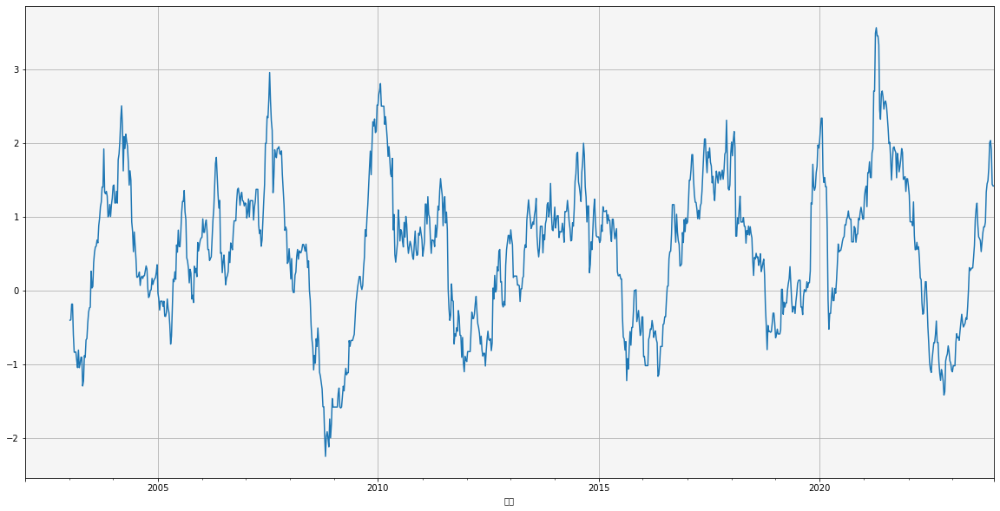

In [16]:
DDW['TWA00']["sharpe"].fillna(method = 'ffill').plot(figsize=(20, 10),label = "TWA00",grid = True)
大盤夏普值 = DDW['TWA00']["sharpe"].fillna(method = 'ffill')
plt.savefig(r'\\192.168.6.41\借券資料\週會圖\大盤夏普')
大盤夏普值.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\大盤夏普值.xlsx')

# 計算全股票夏普

100%|██████████| 1776/1776 [00:49<00:00, 35.64it/s]


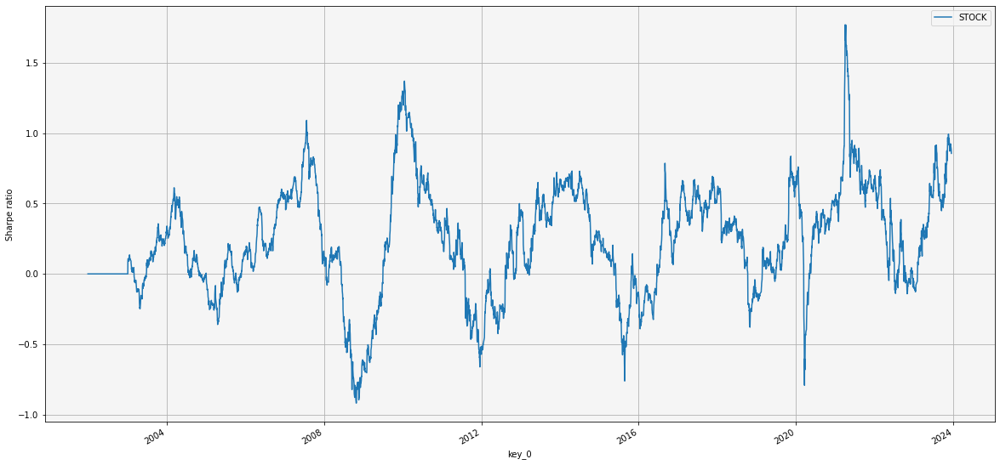

In [17]:
#Sharpe
shar = pd.DataFrame()

for i in tqdm(AS):
    change = data_dict[str(i)]["還原收盤價"].pct_change()
    sigma = change.std()
    data_dict[str(i)]['rolling_ret'] = change.rolling(252).mean()
    data_dict[str(i)]['rolling_std'] = change.rolling(252).std()
    data_dict[str(i)]['sharpe'] = (data_dict[str(i)]['rolling_ret'] / data_dict[str(i)]['rolling_std']) * (252 ** 0.5)

    APT = data_dict[str(i)]["sharpe"]
    APT.name = i

    if len(shar) == 0:
        shar = APT
    else:
        shar = pd.merge(shar,APT,left_on = shar.index,right_on = APT.index,how = 'outer')
        shar.set_index('key_0',inplace = True)

plt.figure(figsize=(8,3))
plt.xlabel("time")
plt.ylabel("Sharpe ratio")
wholesharpe = shar.sort_index().sum(axis = 1)/len(shar.columns)

DDW['TWA00']["whole_sharpe"] = wholesharpe.groupby(pd.Grouper(freq='1W')).tail(1)
wholesharpe.plot(figsize=(20, 10),label = "STOCK",grid = True)
plt.legend()
plt.savefig("一籃子夏普")

<AxesSubplot:xlabel='日期'>

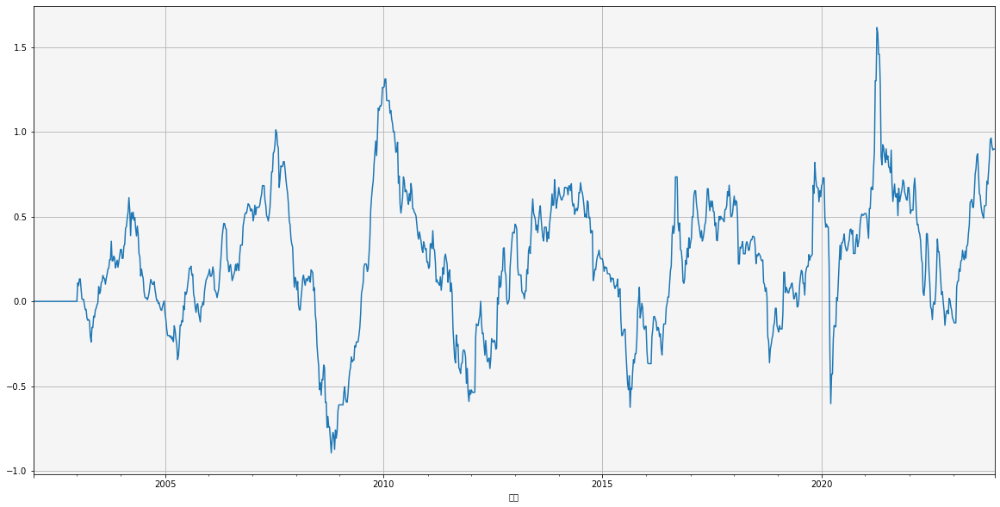

In [18]:
DDW['TWA00']["whole_sharpe"].fillna(method = 'ffill').plot(figsize=(20, 10),label = "TWA00",grid = True)

In [19]:
DDW['TWA00']["whole_sharpe"].tail(10)
#DDW['TWA00']["sharpe"].tail(10)

日期
2023-10-13    0.709729
2023-10-20    0.692092
2023-10-27    0.770357
2023-11-03    0.846370
2023-11-10    0.952804
2023-11-17    0.963928
2023-11-24    0.917586
2023-12-01    0.893539
2023-12-08    0.899318
2023-12-15         NaN
Freq: W-FRI, Name: whole_sharpe, dtype: float64

<AxesSubplot:xlabel='日期'>

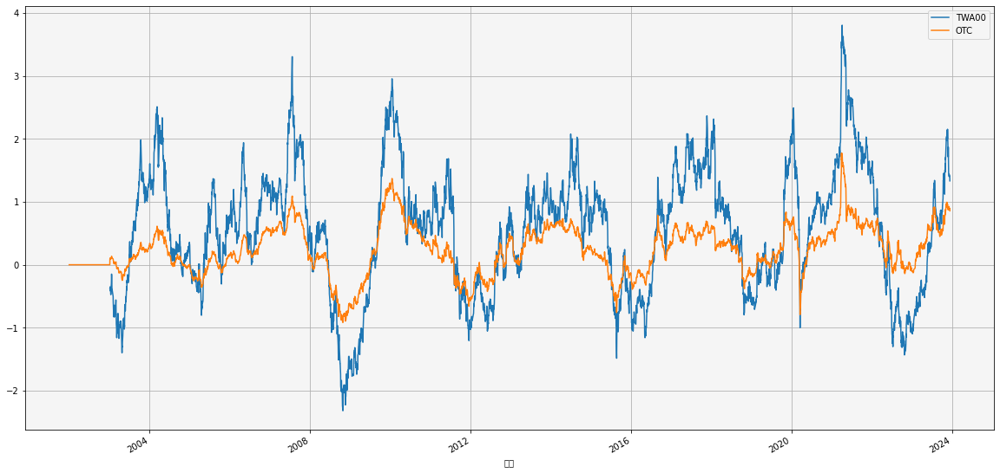

In [20]:
pd.DataFrame(shar2).merge(pd.DataFrame(wholesharpe).rename(columns = {0:'OTC'}),left_index = True, right_index = True).plot(figsize=(20, 10),grid = True)

# 母關鍵點策略

100%|██████████| 1142/1142 [03:23<00:00,  5.62it/s]


Text(0, 0.5, 'Profit')

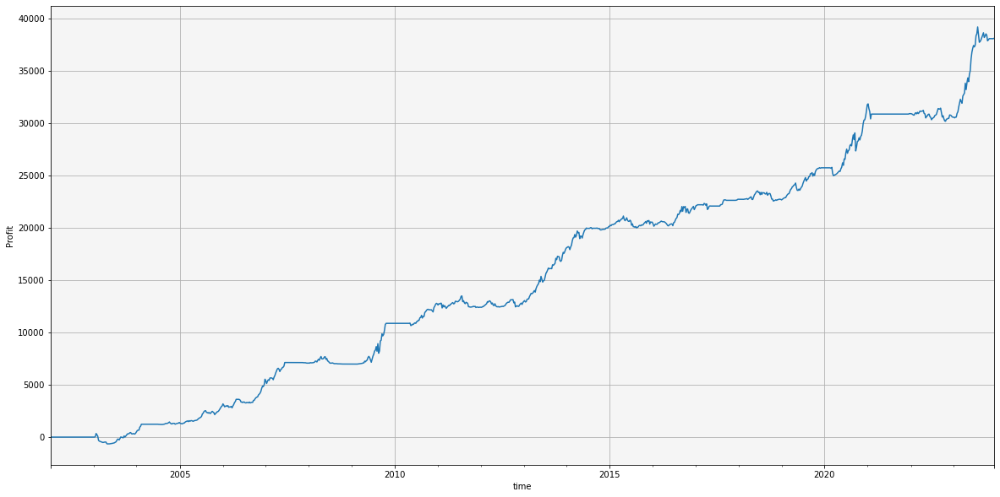

In [21]:
import talib
ERROR = []
trr = pd.DataFrame()
pz = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['MAX52'] = DDW[str(x)]["還原收盤價"].rolling(52).max()
    DDW[str(x)]["MAX52S"] = DDW[str(x)]["MAX52"].shift(1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    DDW[str(x)]['一籃子夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    KPBS = 0
    KPBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["MAX52S"].iloc[z] and  DDW[str(x)]["成交金額(千)"].iloc[z] > 50000 and  DDW[str(x)]["資使用率"].iloc[z] < 15 \
        and DDW[str(x)]["成交金額(千)"].shift(1).iloc[z] > 20000 and DDW[str(x)]["還原收盤價"].iloc[z] < 200 \
        and DDW[str(x)]["大盤夏普"].iloc[z] < 1.5 and DDW[str(x)]["週轉率(%)"].iloc[z] < 7 :
        
            KPBS = 1

        elif ((DDW[str(x)]["4MA"].iloc[z] < DDW[str(x)]["4MAS"].iloc[z] and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z]) ) \
        or DDW[str(x)]["大盤夏普"].iloc[z] >1.5   :
            KPBS = 0
            #buy.append("0")
        KPBUY.append(KPBS)
    DDW[str(x)]["KPBUY"] = KPBUY
    DDW[str(x)]["KPBUYS"] = DDW[str(x)]["KPBUY"].shift(1)
    pzb = DDW[str(x)]["KPBUYS"]  
    pzb.name = str(x)
    pzbs = DDW[str(x)]["KPBUY"]
    pzbs.name = str(x)
    DDW[str(x)]["KPRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["KPBUYS"].dropna().astype(int)
    PT = DDW[str(x)]["KPRR"]
    PT.name = str(x)
    if len(trr) == 0:
        trr = PT
    else:
        trr = pd.merge(trr,PT,left_on = trr.index,right_on = PT.index,how = 'outer')
        trr.set_index('key_0',inplace = True)
    if len(pz) == 0:
        pz = pzbs
    else:
        pz = pd.merge(pz,pzbs,left_on = pz.index,right_on = pzbs.index,how = 'outer')
        pz.set_index('key_0',inplace = True)

trrb =trr.replace(np.inf,0).sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

plt.xlabel("time")
plt.ylabel("Profit")


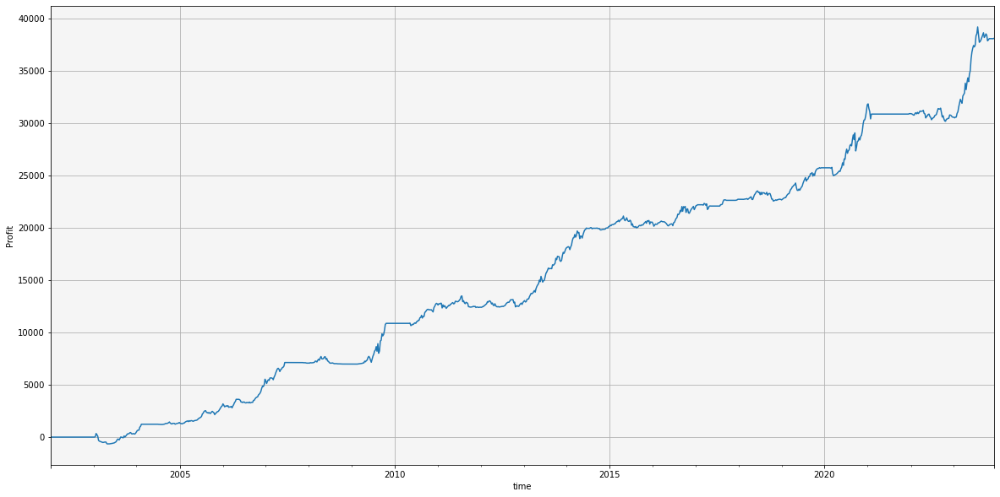

In [22]:
關鍵點損益圖 = trr.replace(np.inf,0).sort_index().sum(axis = 1).cumsum().plot(figsize=(20,10),grid = True)

plt.xlabel("time")
plt.ylabel("Profit")
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\關鍵點.png')

# 整理多單買賣訊01值

65.17888307155323
0.0
342.0


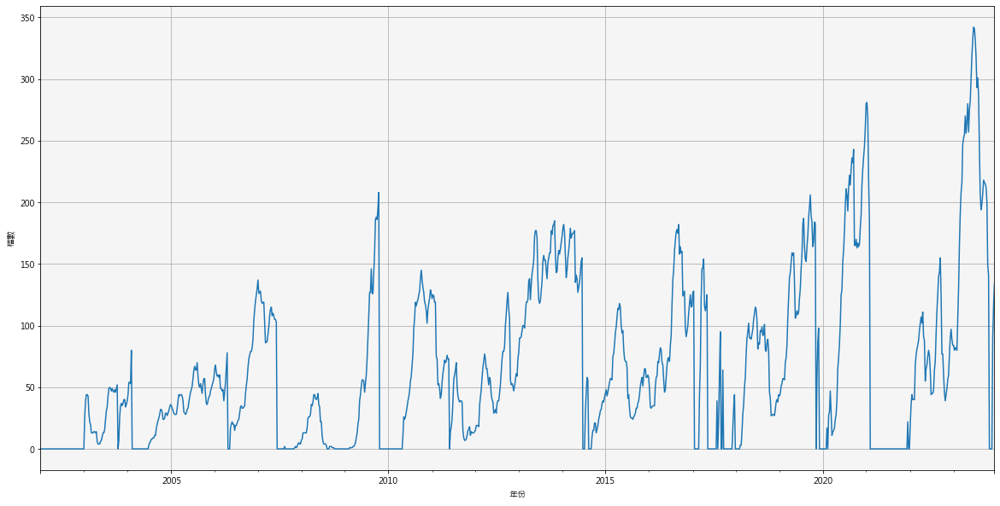

In [23]:
pz1 = pz.sort_index()
f = lambda x :float(x)
pz2 = pz1.applymap(f)
pz3 = pz2.sum(axis=1)
pz4 = pz3.groupby(pd.Grouper(freq='1W')).tail(1)
plt.rcParams['font.family'] = ['Microsoft JhengHei'] # 中文標籤
plt.rcParams['axes.unicode_minus'] = False # 負號
print(pz4.mean())
print(pz4.min())
print(pz4.max())
pz4.plot(figsize=(20, 10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\關鍵點部位變化.png')


# 填寫資料更新日期

In [24]:
當週日期 = trr.index[-1]
前週日期 = trr.index[-2]

# 關鍵點當週買進部位

In [25]:
關鍵點持有部位 = pz2.loc[當週日期][(pz2.loc[當週日期]==1)]
關鍵點買進 = pz2.loc[當週日期][(pz2.loc[當週日期]==1) & (pz2.loc[前週日期]==0)]
關鍵點賣出 = pz2.loc[當週日期][(pz2.loc[當週日期]==0) & (pz2.loc[前週日期]==1)]
print("關鍵點買進標的")
print(關鍵點買進)
print("關鍵點買進檔數" , len(關鍵點買進))
print("關鍵點持有部位數目" , len(關鍵點持有部位))
print("關鍵點賣出部位")
print(關鍵點賣出)
print("關鍵點賣出檔數" , len(關鍵點賣出))


關鍵點買進標的
1521    1.0
1615    1.0
2347    1.0
2374    1.0
2392    1.0
2603    1.0
2903    1.0
3019    1.0
3028    1.0
3086    1.0
3211    1.0
3266    1.0
4933    1.0
5515    1.0
5609    1.0
6176    1.0
6182    1.0
6292    1.0
8103    1.0
Name: 2023-12-15 00:00:00, dtype: float64
關鍵點買進檔數 19
關鍵點持有部位數目 134
關鍵點賣出部位
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
關鍵點賣出檔數 0


# 關鍵點歷年損益

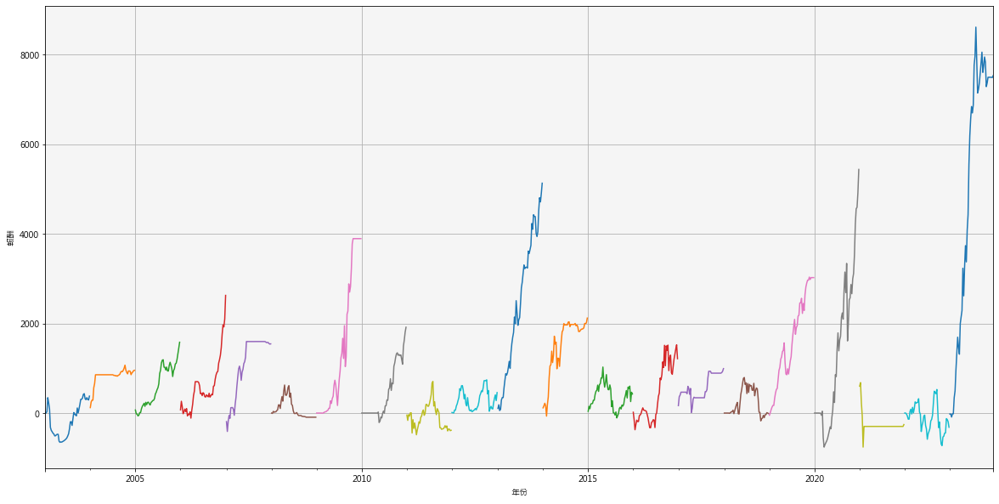

In [26]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrt = trr.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtfig = trrt.plot(figsize=(20, 10),grid = True)
trrtfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtfig.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\關鍵點歷年損益.png')


# 查詢式關鍵點損益

In [27]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
trrtall = pd.Series()
for h in yl :
    trrt = trr.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtall = pd.concat([trrtall,trrt])
trrtall = pd.DataFrame(trrtall)    

In [28]:
trrtall = trrtall.reset_index(drop = False)
trrtall = trrtall.rename(columns = {'index':'datetime',0:'returns'})

In [29]:
trrtall['2003'] = np.where(trrtall.datetime<'2004-01-01',trrtall['returns'],np.nan)
trrtall['2004'] = np.where(((trrtall.datetime<'2005-01-01') & (trrtall.datetime>='2004-01-01')),trrtall['returns'],np.nan)
trrtall['2005'] = np.where(((trrtall.datetime<'2006-01-01') & (trrtall.datetime>='2005-01-01')),trrtall['returns'],np.nan)
trrtall['2006'] = np.where(((trrtall.datetime<'2007-01-01') & (trrtall.datetime>='2006-01-01')),trrtall['returns'],np.nan)
trrtall['2007'] = np.where(((trrtall.datetime<'2008-01-01') & (trrtall.datetime>='2007-01-01')),trrtall['returns'],np.nan)
trrtall['2008'] = np.where(((trrtall.datetime<'2009-01-01') & (trrtall.datetime>='2008-01-01')),trrtall['returns'],np.nan)
trrtall['2009'] = np.where(((trrtall.datetime<'2010-01-01') & (trrtall.datetime>='2009-01-01')),trrtall['returns'],np.nan)
trrtall['2010'] = np.where(((trrtall.datetime<'2011-01-01') & (trrtall.datetime>='2010-01-01')),trrtall['returns'],np.nan)
trrtall['2011'] = np.where(((trrtall.datetime<'2012-01-01') & (trrtall.datetime>='2011-01-01')),trrtall['returns'],np.nan)
trrtall['2012'] = np.where(((trrtall.datetime<'2013-01-01') & (trrtall.datetime>='2012-01-01')),trrtall['returns'],np.nan)
trrtall['2013'] = np.where(((trrtall.datetime<'2014-01-01') & (trrtall.datetime>='2013-01-01')),trrtall['returns'],np.nan)
trrtall['2014'] = np.where(((trrtall.datetime<'2015-01-01') & (trrtall.datetime>='2014-01-01')),trrtall['returns'],np.nan)
trrtall['2015'] = np.where(((trrtall.datetime<'2016-01-01') & (trrtall.datetime>='2015-01-01')),trrtall['returns'],np.nan)
trrtall['2016'] = np.where(((trrtall.datetime<'2017-01-01') & (trrtall.datetime>='2016-01-01')),trrtall['returns'],np.nan)
trrtall['2017'] = np.where(((trrtall.datetime<'2018-01-01') & (trrtall.datetime>='2017-01-01')),trrtall['returns'],np.nan)
trrtall['2018'] = np.where(((trrtall.datetime<'2019-01-01') & (trrtall.datetime>='2018-01-01')),trrtall['returns'],np.nan)
trrtall['2019'] = np.where(((trrtall.datetime<'2020-01-01') & (trrtall.datetime>='2019-01-01')),trrtall['returns'],np.nan)
trrtall['2020'] = np.where(((trrtall.datetime<'2021-01-01') & (trrtall.datetime>='2020-01-01')),trrtall['returns'],np.nan)
trrtall['2021'] = np.where(((trrtall.datetime<'2022-01-01') & (trrtall.datetime>='2021-01-01')),trrtall['returns'],np.nan)
trrtall['2022'] = np.where(((trrtall.datetime<'2023-01-01') & (trrtall.datetime>='2022-01-01')),trrtall['returns'],np.nan)
trrtall['2023'] = np.where(((trrtall.datetime<'2024-01-01') & (trrtall.datetime>='2023-01-01')),trrtall['returns'],np.nan)

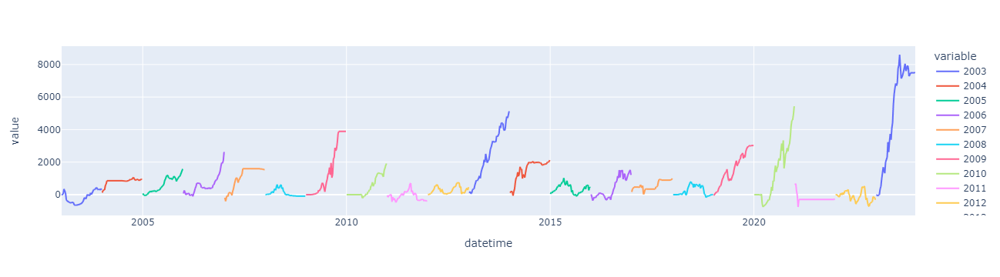

In [30]:
px.line(trrtall, x = 'datetime', y= yl)

# 放空補丁策略

In [31]:
import talib
ERROR = []
trrs = pd.DataFrame()
pzs = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['LOW5'] = DDW[str(x)]["收盤價"].rolling(2).min()
    DDW[str(x)]['SMAX3'] = DDW[str(x)]["最高價"].rolling(2).max()
    DDW[str(x)]["LOW5S"] = DDW[str(x)]["LOW5"].shift(1)
    DDW[str(x)]["4SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=4, matype=0)
    DDW[str(x)]["COVERMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=7, matype=0)
    DDW[str(x)]["SCHECKMA"] = talib.MA(DDW[str(x)]["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["4SELLMAS"] = DDW[str(x)]["4SELLMA"].shift(1)
    DDW[str(x)]["30SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["60SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    
    DDW['TWA00']['4SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=2, matype=0)
    DDW['TWA00']['20SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=20, matype=0)
    
    BSS = 0
    SELL =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['成交金額(千)'].iloc[z] > 100000 and DDW[str(x)]["30SELLMA"].iloc[z] < DDW[str(x)]["30SELLMA"].shift(1).iloc[z] \
        and DDW[str(x)]["還原收盤價"].iloc[z]  <  DDW[str(x)]["60SELLMA"].iloc[z] and DDW[str(x)]["SCHECKMA"].iloc[z] < DDW[str(x)]["SCHECKMA"].shift(4).iloc[z]\
        and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['LOW5S'].iloc[z]  and DDW[str(x)]['資使用率'].iloc[z] > 3 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 140 :
         
            BSS = -1

        elif   (DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['COVERMA'].iloc[z] and DDW[str(x)]['COVERMA'].iloc[z] > DDW[str(x)]['COVERMA'].shift(1).iloc[z]) \
         or DDW[str(x)]['融資維持率(%)'].iloc[z] < 130 or DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]["COVERMA"].iloc[z] :
            BSS = 0
        # or 
        #DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]['最高價'].shift(4).iloc[z] or
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        SELL.append(BSS)
    DDW[str(x)]["SELL"] = SELL
    DDW[str(x)]["SELLS"] = DDW[str(x)]["SELL"].shift(1)
    ps = DDW[str(x)]["SELLS"]  
    ps.name = str(x)
    pss = DDW[str(x)]["SELL"]
    pss.name = str(x)
    DDW[str(x)]["SRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["SELLS"].dropna().astype(int)
    PTS = DDW[str(x)]["SRR"]
    PTS.name = str(x)
    if len(trrs) == 0:
        trrs = PTS
    else:
        trrs = pd.merge(trrs,PTS,left_on = trrs.index,right_on = PTS.index,how = 'outer')
        trrs.set_index('key_0',inplace = True)
    if len(pzs) == 0:
        pzs = pss
    else:
        pzs = pd.merge(pzs,pss,left_on = pzs.index,right_on = pss.index,how = 'outer')
        pzs.set_index('key_0',inplace = True)

trrsp = trrs.sort_index().sum(axis = 1).cumsum()


100%|██████████| 1142/1142 [02:40<00:00,  7.12it/s]


<AxesSubplot:xlabel='key_0'>

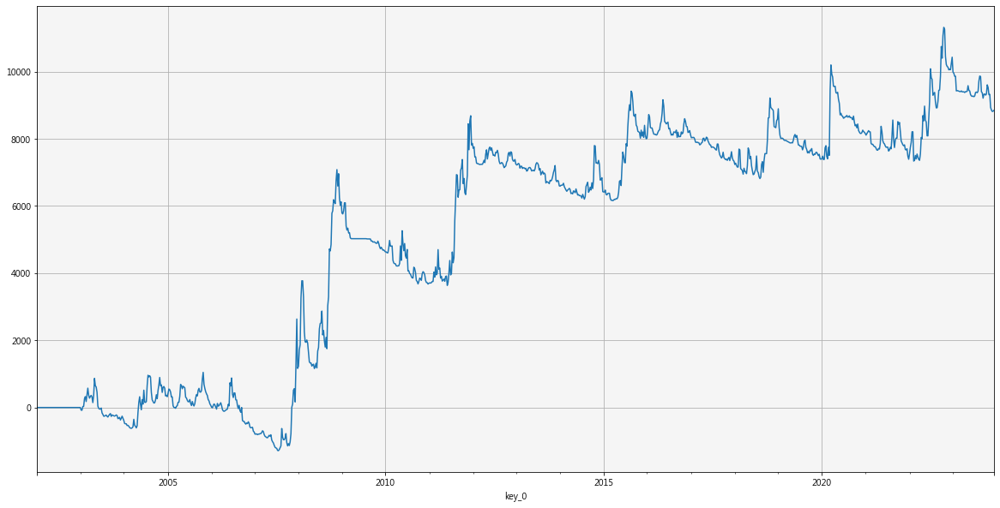

In [32]:
trrsp.plot(figsize = (20,10),grid = True)

# 整理空單買賣訊01值

-49.28534031413613
-180.0
0.0


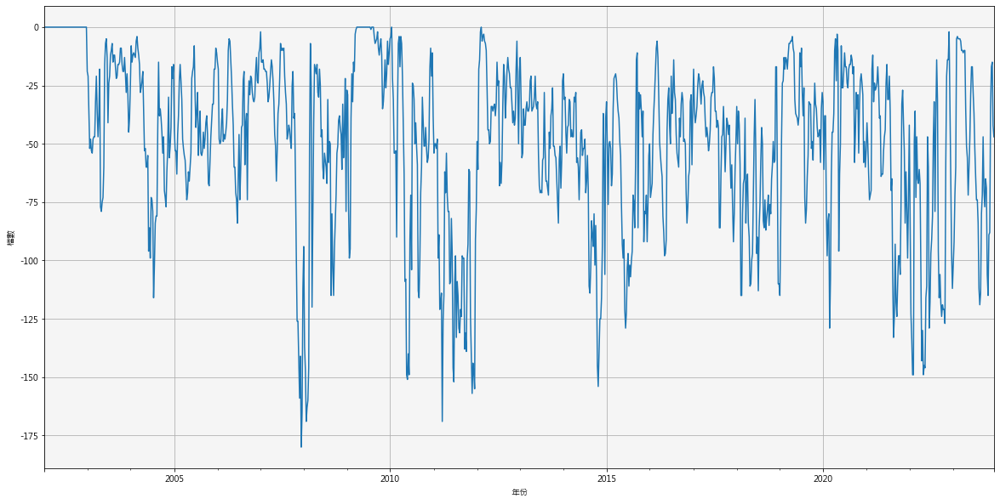

In [33]:
pzs1 = pzs.sort_index()
f1 = lambda x :float(x)
pzs2 = pzs1.applymap(f1)
pzs3 = pzs2.sum(axis=1)
pzs4 = pzs3.groupby(pd.Grouper(freq='1W')).tail(1)
print(pzs4.mean())
print(pzs4.min())
print(pzs4.max())
pzs4.plot(figsize=(20,10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('空方部位變化表.png')
pzs4.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\空單部位變化.xlsx')

In [34]:
trrsp['2023']

key_0
2023-01-06    9988.998394
2023-01-13    9954.800542
2023-01-20    9866.277606
2023-01-27    9866.277606
2023-02-03    9428.330962
2023-02-10    9437.803387
2023-02-17    9430.080938
2023-02-24    9421.532294
2023-03-03    9410.222194
2023-03-10    9406.262531
2023-03-17    9427.691730
2023-03-24    9401.728644
2023-03-31    9400.497789
2023-04-07    9402.354612
2023-04-14    9380.722079
2023-04-21    9406.984602
2023-04-28    9405.076670
2023-05-05    9421.523758
2023-05-12    9583.623157
2023-05-19    9446.855271
2023-05-26    9427.049158
2023-06-02    9316.972626
2023-06-09    9279.194002
2023-06-16    9264.891700
2023-06-23    9274.020303
2023-06-30    9255.917032
2023-07-07    9278.523159
2023-07-14    9382.689835
2023-07-21    9393.739344
2023-07-28    9374.285161
2023-08-04    9419.424078
2023-08-11    9725.480458
2023-08-18    9870.492749
2023-08-25    9857.792782
2023-09-01    9403.511627
2023-09-08    9370.190133
2023-09-15    9211.639665
2023-09-22    9330.044033
2023-0

# 空單當週放空部位

In [35]:
空單放空部位 = pzs2.loc[當週日期][(pzs2.loc[當週日期]== -1)]
空單放空 = pzs2.loc[當週日期][(pzs2.loc[當週日期]== -1) & (pzs2.loc[前週日期]==0)]
空單回補 = pzs2.loc[當週日期][(pzs2.loc[當週日期]==0) & (pzs2.loc[前週日期]==-1)]
print("空單放空標的")
print(空單放空)
print("空單放空檔數" , len(空單放空))
print("空單持有空單部位數目" , len(空單放空部位))
print("空單回補部位")
print(空單回補)
print("空單回補檔數" , len(空單回補))

空單放空標的
2228   -1.0
2409   -1.0
3289   -1.0
3454   -1.0
3481   -1.0
3587   -1.0
4977   -1.0
6146   -1.0
6188   -1.0
6569   -1.0
8048   -1.0
8050   -1.0
8069   -1.0
8358   -1.0
8996   -1.0
Name: 2023-12-15 00:00:00, dtype: float64
空單放空檔數 15
空單持有空單部位數目 47
空單回補部位
1565    0.0
1605    0.0
2206    0.0
2337    0.0
2634    0.0
3003    0.0
3056    0.0
3673    0.0
5371    0.0
6196    0.0
Name: 2023-12-15 00:00:00, dtype: float64
空單回補檔數 10


In [36]:
#空單放空部位

# 空單歷年損益

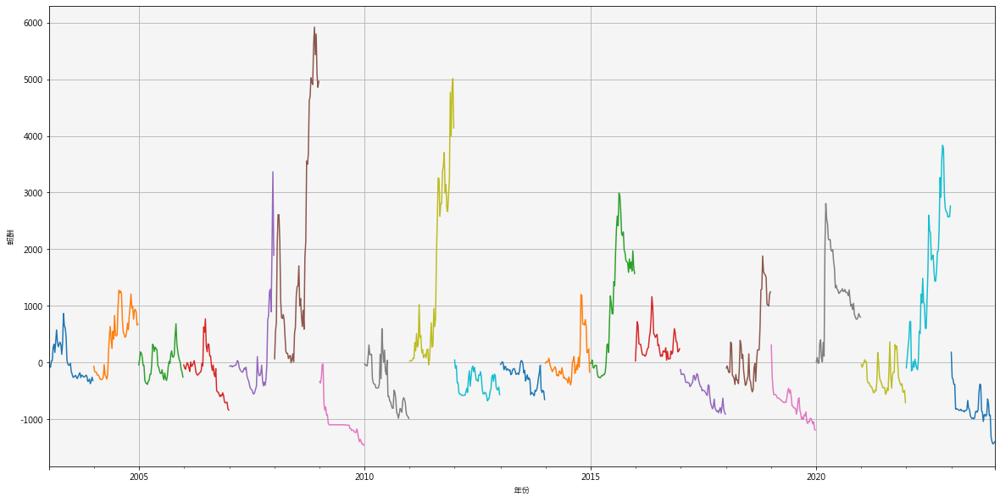

In [37]:

yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrts = trrs.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtsfig = trrts.plot(figsize=(20,10),grid = True)
trrtsfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtsfig.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\空單歷年損益.png')

# 查詢式空單損益

In [38]:
 yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']

trrtsall = pd.Series()
for h in yl :
    trrts = trrs.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtsall = pd.concat([trrtsall,trrts])
trrtsall = pd.DataFrame(trrtsall)

In [39]:
trrtsall = trrtsall.reset_index(drop = False)
trrtsall = trrtsall.rename(columns = {'index':'datetime',0:'returns'})

In [40]:
trrtsall['2003'] = np.where(trrtsall.datetime<'2004-01-01',trrtsall['returns'],np.nan)
trrtsall['2004'] = np.where(((trrtsall.datetime<'2005-01-01') & (trrtsall.datetime>='2004-01-01')),trrtsall['returns'],np.nan)
trrtsall['2005'] = np.where(((trrtsall.datetime<'2006-01-01') & (trrtsall.datetime>='2005-01-01')),trrtsall['returns'],np.nan)
trrtsall['2006'] = np.where(((trrtsall.datetime<'2007-01-01') & (trrtsall.datetime>='2006-01-01')),trrtsall['returns'],np.nan)
trrtsall['2007'] = np.where(((trrtsall.datetime<'2008-01-01') & (trrtsall.datetime>='2007-01-01')),trrtsall['returns'],np.nan)
trrtsall['2008'] = np.where(((trrtsall.datetime<'2009-01-01') & (trrtsall.datetime>='2008-01-01')),trrtsall['returns'],np.nan)
trrtsall['2009'] = np.where(((trrtsall.datetime<'2010-01-01') & (trrtsall.datetime>='2009-01-01')),trrtsall['returns'],np.nan)
trrtsall['2010'] = np.where(((trrtsall.datetime<'2011-01-01') & (trrtsall.datetime>='2010-01-01')),trrtsall['returns'],np.nan)
trrtsall['2011'] = np.where(((trrtsall.datetime<'2012-01-01') & (trrtsall.datetime>='2011-01-01')),trrtsall['returns'],np.nan)
trrtsall['2012'] = np.where(((trrtsall.datetime<'2013-01-01') & (trrtsall.datetime>='2012-01-01')),trrtsall['returns'],np.nan)
trrtsall['2013'] = np.where(((trrtsall.datetime<'2014-01-01') & (trrtsall.datetime>='2013-01-01')),trrtsall['returns'],np.nan)
trrtsall['2014'] = np.where(((trrtsall.datetime<'2015-01-01') & (trrtsall.datetime>='2014-01-01')),trrtsall['returns'],np.nan)
trrtsall['2015'] = np.where(((trrtsall.datetime<'2016-01-01') & (trrtsall.datetime>='2015-01-01')),trrtsall['returns'],np.nan)
trrtsall['2016'] = np.where(((trrtsall.datetime<'2017-01-01') & (trrtsall.datetime>='2016-01-01')),trrtsall['returns'],np.nan)
trrtsall['2017'] = np.where(((trrtsall.datetime<'2018-01-01') & (trrtsall.datetime>='2017-01-01')),trrtsall['returns'],np.nan)
trrtsall['2018'] = np.where(((trrtsall.datetime<'2019-01-01') & (trrtsall.datetime>='2018-01-01')),trrtsall['returns'],np.nan)
trrtsall['2019'] = np.where(((trrtsall.datetime<'2020-01-01') & (trrtsall.datetime>='2019-01-01')),trrtsall['returns'],np.nan)
trrtsall['2020'] = np.where(((trrtsall.datetime<'2021-01-01') & (trrtsall.datetime>='2020-01-01')),trrtsall['returns'],np.nan)
trrtsall['2021'] = np.where(((trrtsall.datetime<'2022-01-01') & (trrtsall.datetime>='2021-01-01')),trrtsall['returns'],np.nan)
trrtsall['2022'] = np.where(((trrtsall.datetime<'2023-01-01') & (trrtsall.datetime>='2022-01-01')),trrtsall['returns'],np.nan)
trrtsall['2023'] = np.where(((trrtsall.datetime<'2024-01-01') & (trrtsall.datetime>='2023-01-01')),trrtsall['returns'],np.nan)

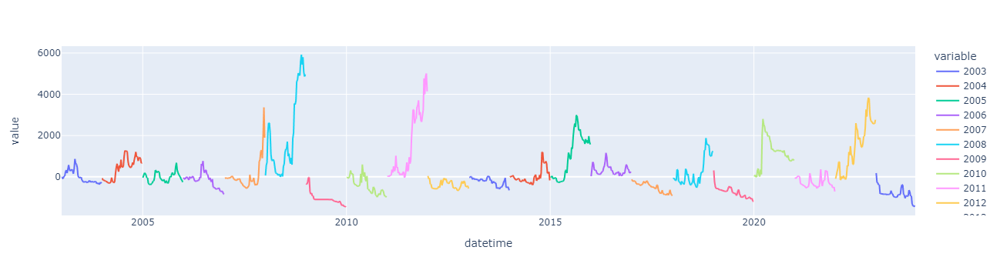

In [41]:
px.line(trrtsall, x = 'datetime', y= yl)

# 欄位檢查

In [42]:
DDW['2330'].tail(10)

,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,當沖比率,週轉率(%),融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,買張1(券商),買張2(券商),買張3(券商),賣張1(券商),賣張2(券商),賣張3(券商),MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-10-13,542.0,554.0,540.0,553.0,72522856.0,0.25,0.00,0.13,169.818298,553.0,0.61,506.95,72.14,357.14,88175.34,E,台灣摩根士丹利,摩根大通,元大,新加坡商瑞銀,凱基-台北,美商高盛,587.72,587.72,537.6,534.202,3.947368,1.339803,1.339803,0,0.0,0.0,532.0,554.0,523.0,532.50,538.424286,555.80,533.75,553.2020,553.2020,0,0.0,0.0
2023-10-20,546.0,556.0,540.0,556.0,80119429.0,0.25,0.00,0.19,170.571396,556.0,0.64,508.63,72.17,358.14,92113.81,E,美商高盛,美林,台灣匯立,摩根大通,元大,花旗環球,587.72,587.72,537.2,537.600,0.542495,1.452287,1.452287,0,0.0,0.0,553.0,556.0,532.0,541.00,540.001429,555.50,532.50,553.1880,553.1880,0,0.0,0.0
2023-10-27,552.0,553.0,530.0,533.0,57073078.0,0.27,0.03,0.07,163.711899,533.0,0.65,509.37,72.05,358.70,90348.23,E,摩根大通,台灣摩根士丹利,富邦,新加坡商瑞銀,美林,港商麥格理,587.72,587.72,539.4,537.200,-4.136691,1.494110,1.494110,0,0.0,-0.0,533.0,556.0,553.0,543.50,539.571429,553.90,541.00,551.8755,551.8755,0,0.0,-0.0
2023-11-03,531.0,549.0,527.0,549.0,60656746.0,0.27,0.02,0.06,168.778198,549.0,0.66,509.80,72.00,359.36,94103.42,E,元大,摩根大通,新加坡商瑞銀,台灣摩根士丹利,美林,美商高盛,587.72,587.72,544.6,539.400,3.001876,1.667760,1.667760,0,0.0,0.0,533.0,553.0,533.0,547.75,538.285714,551.90,543.50,550.0390,550.0390,0,0.0,0.0
2023-11-10,553.0,557.0,550.0,557.0,51455434.0,0.26,0.00,0.05,171.014099,557.0,0.66,510.20,72.11,360.12,95664.11,E,台灣摩根士丹利,富邦,新加坡商瑞銀,新加坡商瑞銀,台灣摩根士丹利,美商高盛,587.72,587.72,549.6,544.600,1.457195,2.009448,2.009448,0,0.0,0.0,549.0,557.0,533.0,548.75,543.285714,550.70,547.75,549.0000,549.0000,0,0.0,0.0
2023-11-17,579.0,583.0,571.0,580.0,103426396.0,0.23,0.00,0.09,176.715195,580.0,0.66,511.37,72.38,361.78,99907.69,E,摩根大通,美林,台灣匯立,台灣摩根士丹利,港商麥格理,美林,587.72,587.72,555.0,549.600,4.129264,2.039498,2.039498,0,0.0,0.0,557.0,583.0,549.0,554.75,551.428571,550.90,548.75,549.3595,549.3595,0,0.0,0.0
2023-11-24,576.0,585.0,574.0,575.0,68321838.0,0.25,0.01,0.05,174.061493,575.0,0.66,511.69,72.46,362.82,98650.03,E,摩根大通,台灣摩根士丹利,美林,花旗環球,台灣摩根士丹利,富邦,587.72,587.72,558.8,555.000,-0.862069,1.913699,1.913699,0,0.0,-0.0,575.0,585.0,557.0,565.25,557.571429,551.40,554.75,550.0160,550.0160,0,0.0,-0.0
2023-12-01,573.0,579.0,565.0,579.0,90813832.0,0.25,0.00,0.11,174.416702,579.0,0.66,512.04,72.51,364.25,98952.13,E,花旗環球,台灣摩根士丹利,港商麥格理,台灣摩根士丹利,花旗環球,摩根大通,587.72,587.72,568.0,558.800,0.695652,1.446007,1.446007,0,0.0,0.0,575.0,585.0,575.0,572.75,561.285714,550.80,565.25,549.5800,549.5800,0,0.0,0.0
2023-12-08,582.0,582.0,566.0,570.0,81992015.0,0.26,0.00,0.15,170.940094,570.0,0.65,512.15,72.51,365.27,96047.48,E,台灣摩根士丹利,凱基-台北,摩根大通,新加坡商瑞銀,元富,摩根大通,587.72,587.72,572.2,568.000,-1.554404,1.423017,1.423017,0,0.0,-0.0,570.0,582.0,575.0,576.00,563.285714,551.30,572.75,550.2355,550.2355,0,0.0,-0.0


# ETF限制型空單

100%|██████████| 1142/1142 [02:40<00:00,  7.12it/s]


<AxesSubplot:xlabel='key_0'>

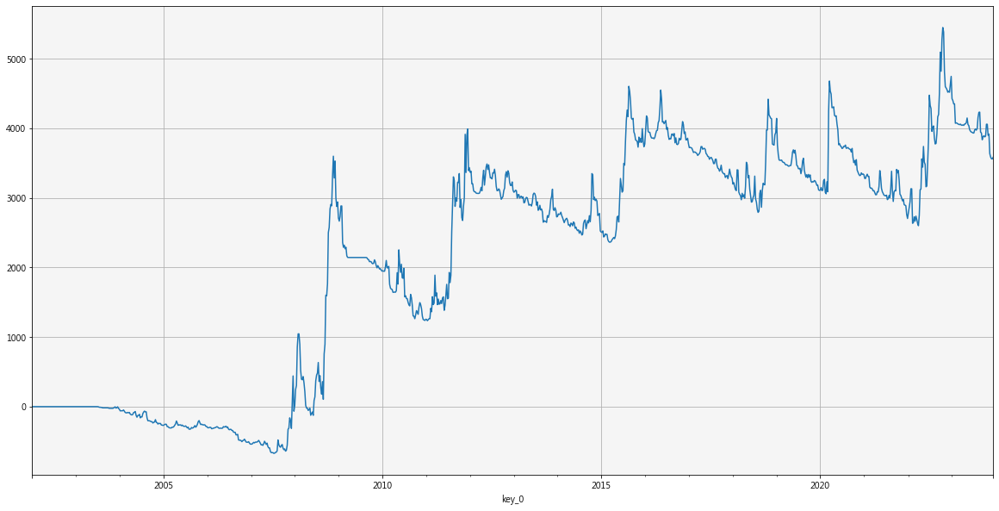

In [43]:
#ETF篩選後
import talib
ERROR = []
trrsETF = pd.DataFrame()
pzsETF = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['LOW5'] = DDW[str(x)]["收盤價"].rolling(2).min()
    DDW[str(x)]['SMAX3'] = DDW[str(x)]["最高價"].rolling(2).max()
    DDW[str(x)]["LOW5S"] = DDW[str(x)]["LOW5"].shift(1)
    DDW[str(x)]["4SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=4, matype=0)
    DDW[str(x)]["COVERMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=7, matype=0)
    DDW[str(x)]["SCHECKMA"] = talib.MA(DDW[str(x)]["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["4SELLMAS"] = DDW[str(x)]["4SELLMA"].shift(1)
    DDW[str(x)]["30SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["60SELLMA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW['TWA00']['4SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=2, matype=0)
    DDW['TWA00']['20SELLHMA'] = talib.MA(DDW['TWA00']["收盤價"].dropna(), timeperiod=20, matype=0)
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    BSSETF = 0
    SELLETF =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['成交金額(千)'].iloc[z] > 100000 and DDW[str(x)]["30SELLMA"].iloc[z] < DDW[str(x)]["30SELLMA"].shift(1).iloc[z] \
        and DDW[str(x)]["還原收盤價"].iloc[z]  <  DDW[str(x)]["60SELLMA"].iloc[z] and DDW[str(x)]["SCHECKMA"].iloc[z] < DDW[str(x)]["SCHECKMA"].shift(4).iloc[z]\
        and DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['LOW5S'].iloc[z]  and DDW[str(x)]['資使用率'].iloc[z] > 3 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 140:
            if DDW[str(x)]['是否為ETF成分股'].iloc[z] == 'E':
                BSSETF = -1
            
            elif SELLETF[-1] == -1:
                BSSETF = -1

            else:
                BSSETF = 0

        elif   (DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['COVERMA'].iloc[z] and DDW[str(x)]['COVERMA'].iloc[z] > DDW[str(x)]['COVERMA'].shift(1).iloc[z]) \
         or DDW[str(x)]['融資維持率(%)'].iloc[z] < 130 or DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]["COVERMA"].iloc[z] :
            BSSETF = 0
        # or 
        #DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]['最高價'].shift(4).iloc[z] or
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        SELLETF.append(BSSETF)
    DDW[str(x)]["SELLETF"] = SELLETF
    DDW[str(x)]["SELLSETF"] = DDW[str(x)]["SELLETF"].shift(1)
    ps = DDW[str(x)]["SELLSETF"]  
    ps.name = str(x)
    pss = DDW[str(x)]["SELLETF"]
    pss.name = str(x)
    DDW[str(x)]["SRRETF"] = DDW[str(x)]["DR"] * DDW[str(x)]["SELLSETF"].dropna().astype(int)
    PTS = DDW[str(x)]["SRRETF"]
    PTS.name = str(x)
    if len(trrsETF) == 0:
        trrsETF = PTS
    else:
        trrsETF = pd.merge(trrsETF,PTS,left_on = trrsETF.index,right_on = PTS.index,how = 'outer')
        trrsETF.set_index('key_0',inplace = True)
    if len(pzsETF) == 0:
        pzsETF = pss
    else:
        pzsETF = pd.merge(pzsETF,pss,left_on = pzsETF.index,right_on = pss.index,how = 'outer')
        pzsETF.set_index('key_0',inplace = True)

trrspETF = trrsETF.sort_index().sum(axis = 1).cumsum()
trrspETF.plot(figsize=(20, 10),grid = True)

<AxesSubplot:xlabel='key_0'>

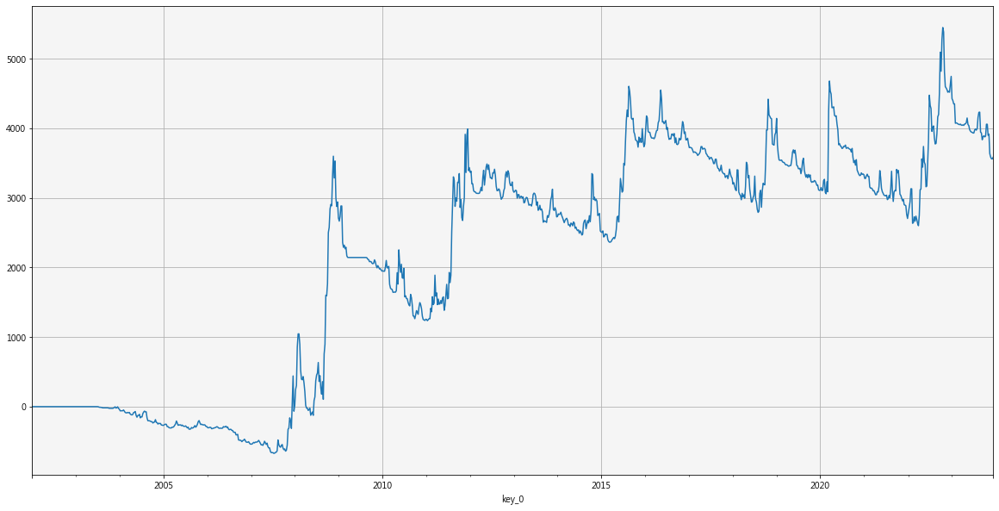

In [44]:
#trrsp.plot(figsize = (20,10),grid = True)
(trrspETF*1).plot(figsize=(20, 10),grid = True)

In [45]:
ETF放空單週損益 = trrsETF.sort_index().sum(axis = 1)

In [46]:
ETF放空單週損益.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\ETF放空單週損益.xlsx')

# 整理限制型空單01值

-25.724258289703315
-103.0
0.0


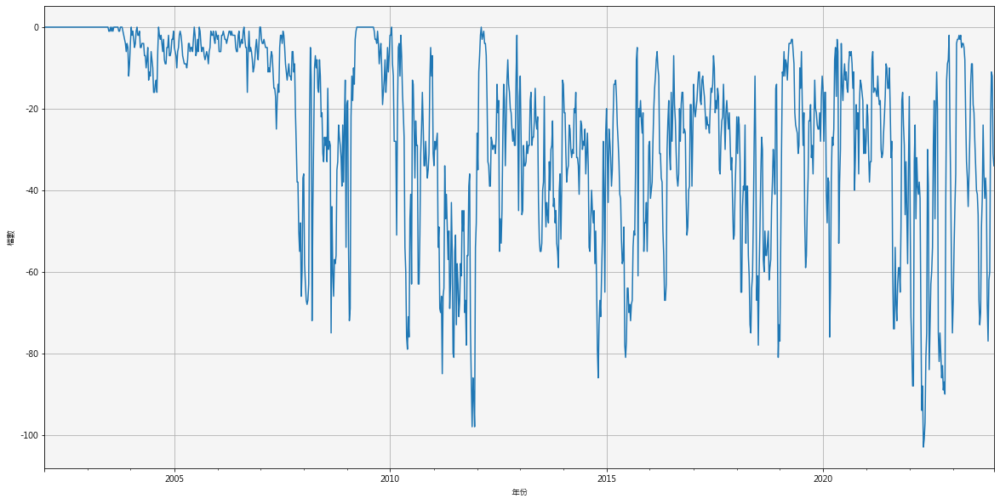

In [47]:
pzs1ETF = pzsETF.sort_index()
f1 = lambda x :float(x)
pzs2ETF = pzs1ETF.applymap(f1)
pzs3ETF = pzs2ETF.sum(axis=1)
pzs4ETF = pzs3ETF.groupby(pd.Grouper(freq='1W')).tail(1)
print(pzs4ETF.mean())
print(pzs4ETF.min())
print(pzs4ETF.max())
pzs4ETF.plot(figsize=(20,10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\ETF空單部位變化.png')
pzs4ETF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\ETF空單部位變化.xlsx')
#pzs4ETF.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\ETF空單部位變化.png')

<AxesSubplot:xlabel='key_0'>

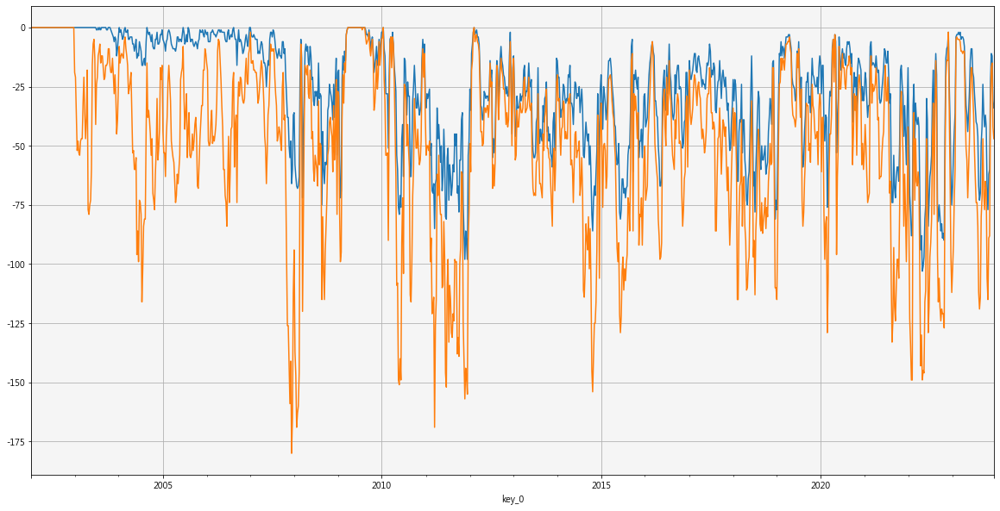

In [48]:
pzs4ETF.plot(figsize=(20,10),grid = True)
pzs4.plot(figsize=(20,10),grid = True)

In [49]:
ETF空單放空部位 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]== -1)]
ETF空單放空 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]== -1) & (pzs2ETF.loc[前週日期]==0)]
ETF空單回補 = pzs2ETF.loc[當週日期][(pzs2ETF.loc[當週日期]==0) & (pzs2ETF.loc[前週日期]==-1)]
print("ETF空單放空標的")
print(ETF空單放空)
print("ETF空單放空檔數" , len(ETF空單放空))
print("ETF空單持有空單部位數目" , len(ETF空單放空部位))
print("ETF空單回補部位")
print(ETF空單回補)
print("ETF空單回補檔數" , len(ETF空單回補))

ETF空單放空標的
2409   -1.0
3454   -1.0
3481   -1.0
3587   -1.0
4977   -1.0
6146   -1.0
6188   -1.0
8050   -1.0
8069   -1.0
8358   -1.0
8996   -1.0
Name: 2023-12-15 00:00:00, dtype: float64
ETF空單放空檔數 11
ETF空單持有空單部位數目 34
ETF空單回補部位
1605    0.0
2206    0.0
2337    0.0
2634    0.0
3003    0.0
3056    0.0
5371    0.0
6196    0.0
Name: 2023-12-15 00:00:00, dtype: float64
ETF空單回補檔數 8


# 台積電策略

In [50]:
import talib
ERROR = []
trr2330 = pd.DataFrame()
pz2330 = pd.DataFrame()


    
DDW['2330']['MAXN2330'] = DDW['2330']["還原收盤價"].rolling(4).max()
DDW['2330']["MAXNS"] = DDW['2330']["MAXN2330"].shift(1)
DDW['2330']['MINN2330'] = DDW['2330']["還原收盤價"].rolling(4).min()
DDW['2330']["MINNS"] = DDW['2330']["MINN2330"].shift(1)
DDW['2330']["2330MA"] = talib.MA(DDW['2330']["還原收盤價"].dropna(), timeperiod=20, matype=0)
DDW['2330']["2330SMA"] = DDW['2330']["2330MA"].shift(1)
DDW['2330']["2330LMA"] = talib.MA(DDW['2330']["還原收盤價"].dropna(), timeperiod=20, matype=0)
DDW['2330']["DR"] = ((DDW['2330']["還原收盤價"] - DDW['2330']["還原收盤價"].shift(1))/DDW['2330']["還原收盤價"].shift(1))*100
DDW['TWA00']['4SHMA'] = talib.MA(DDW['TWA00']["sharpe"].dropna(), timeperiod=4, matype=0)
DDW['TWA00']['20SHMA'] = talib.MA(DDW['TWA00']["sharpe"].dropna(), timeperiod=20, matype=0)
DDW['2330']['出場價'] = DDW['2330']["最低價"].rolling(4).min().shift(1)
BS2330 = 0
BUY2330 =[]
for z in range(len(DDW['2330'])):

    if  DDW['2330']["還原收盤價"].iloc[z]  >  DDW['2330']["2330MA"].iloc[z] and DDW['2330']['收盤價'].iloc[z] > DDW['2330']['最高價'].rolling(2).max().shift(1).iloc[z] \
    and   DDW['TWA00']['4SHMA'].iloc[z] < 0.3 :
         BS2330 = 1

    elif  DDW['2330']["收盤價"].iloc[z] < DDW['2330']["出場價"].iloc[z]   :
        BS2330 = 0
        
    
        BS2330 = 0
        #buy.append("0")
    BUY2330.append(BS2330)
DDW['2330']["BUY2330"] = BUY2330
DDW['2330']["BUY2330S"] = DDW['2330']["BUY2330"].shift(1)
pz2330 = DDW['2330']["BUY2330S"]  
pz2330.name = '2330'
pzz2330 = DDW['2330']["BUY2330"]
pzz2330.name = '2330'
DDW['2330']["2330RR"] = DDW['2330']["DR"] * DDW['2330']["BUY2330S"].dropna().astype(int)
PTS2330 = DDW['2330']["2330RR"]
PTS2330.name = '2330'
if len(trr2330) == 0:
    trr2330 = PTS2330
else:
    trr2330 = pd.merge(trr2330,PTS2330,left_on = trrs.index,right_on = PTS.index,how = 'outer')
    trr2330.set_index('key_0',inplace = True)



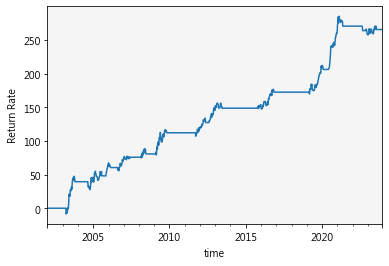

In [51]:
trr2330fig = trr2330.cumsum().plot()
trr2330fig = plt.gcf()
plt.xlabel("time")
plt.ylabel("Return Rate")
trr2330fig.savefig('2330')

# 全市場夏普處理與合併

In [52]:
# 日期處理及設定reblance間隔

#設定rebalance頻率及sharpe觀察日數
rebalance = 52

#設定納入股票檔數
count = 10
fee = 2
#主程式
shar = pd.DataFrame()

#計算個股Sharpe ratio
for i in tqdm(DDW.keys()):
    change = DDW[str(i)]["還原收盤價"].pct_change()
    sigma = change.std()
    DDW[str(i)]['rolling_ret'] = change.rolling(rebalance).mean()
    DDW[str(i)]['rolling_std'] = change.rolling(rebalance).std()
    DDW[str(i)]['sharpe105'] = DDW[str(i)]['rolling_ret'] / DDW[str(i)]['rolling_std']
    APT = DDW[str(i)]["sharpe105"]
    APT.name = str(i)

    if len(shar) == 0:
        shar = APT
    else:
        shar = pd.merge(shar,APT,left_on = shar.index,right_on = APT.index,how = 'outer')
        shar.set_index('key_0',inplace = True)
        shar.index.name = '日期'
shar1 = shar.quantile(0.99,axis= 1)
shar2 = pd.DataFrame(shar1.sort_index()).rename(columns = {0.99:'sharp1'})
for key in tqdm(DDW.keys()):
    DDW[key] =  DDW[key].merge(shar2,left_index=True,right_index = True,how='left')
DDW['2330'].tail(1)

100%|██████████| 1776/1776 [00:01<00:00, 1114.62it/s]


,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,當沖比率,週轉率(%),融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,買張1(券商),買張2(券商),買張3(券商),賣張1(券商),賣張2(券商),賣張3(券商),MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR,SELLETF,SELLSETF,SRRETF,MAXN2330,MAXNS,MINN2330,MINNS,2330MA,2330SMA,2330LMA,出場價,BUY2330,BUY2330S,2330RR,rolling_ret,rolling_std,sharpe105,sharp1
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-12-15,572.0,581.0,570.0,578.0,35734272.0,0.26,0.0,0.13,172.9095,578.0,0.65,512.21,72.56,365.83,97288.37,E,新加坡商瑞銀,台灣摩根士丹利,摩根大通,摩根大通,富邦,臺銀證券,587.72,587.72,576.4,572.2,1.403509,1.423017,1.423017,0,0.0,0.0,570.0,582.0,570.0,575.5,569.714286,551.85,576.0,550.9425,550.9425,0,0.0,0.0,0,0.0,0.0,579.0,580.0,570.0,570.0,550.9425,550.2355,550.9425,565.0,0,0.0,0.0,0.004744,0.032089,0.147832,0.431111


# 去除多欄(資料多_X才處理)

In [53]:
#for key in tqdm(DDW.keys()):
    #DDW[key] = DDW[key].drop(columns = ['sharp1_x','sharp1_y'])

# M夏普策略

In [54]:
import talib
ERROR = []
trrmsharpe = pd.DataFrame()
pzmsp = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    BQT = 0
    BUYQT =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['sharpe105'].iloc[z] > DDW[str(x)]['sharp1'].iloc[z]  and DDW[str(x)]['成交金額(千)'].iloc[z] > 30000 and DDW[str(x)]['sharpe105'].iloc[z] > 0 \
        and DDW[str(x)]['資使用率'].iloc[z] < 30 and DDW[str(x)]['大盤夏普'].iloc[z] > 0.4 :
            BQT = 1

        elif   DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z] or  DDW[str(x)]['大盤夏普'].iloc[z] < 0.2 :
            BQT = 0
        
        #if  DDW['TWA00']['4SELLHMA'].iloc[z] > DDW['TWA00']['20SELLHMA'].iloc[z]  :
            #BSS = 0
            
        BUYQT.append(BQT)
    DDW[str(x)]["BUYQT"] = BUYQT
    DDW[str(x)]["BUYQTS"] = DDW[str(x)]["BUYQT"].shift(1)
    tqt = DDW[str(x)]["BUYQTS"]  
    tqt.name = str(x)
    pqt = DDW[str(x)]["BUYQT"]
    pqt.name = str(x)
    DDW[str(x)]["QTRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["BUYQTS"].dropna().astype(int)
    PQT = DDW[str(x)]["QTRR"]
    PQT.name = str(x)    
    if len(trrmsharpe) == 0:
        trrmsharpe = PQT
    else:
        trrmsharpe = pd.merge(trrmsharpe,PQT,left_on = trrmsharpe.index,right_on = PQT.index,how = 'outer')
        trrmsharpe.set_index('key_0',inplace = True)
    if len(pzmsp) == 0:
        pzmsp = pqt
    else:
        pzmsp = pd.merge(pzmsp,pqt,left_on = pzmsp.index,right_on = pqt.index,how = 'outer')
        pzmsp.set_index('key_0',inplace = True)

tqt1 = trrmsharpe.sort_index().sum(axis = 1).cumsum()


100%|██████████| 1142/1142 [05:44<00:00,  3.31it/s]


<AxesSubplot:xlabel='key_0'>

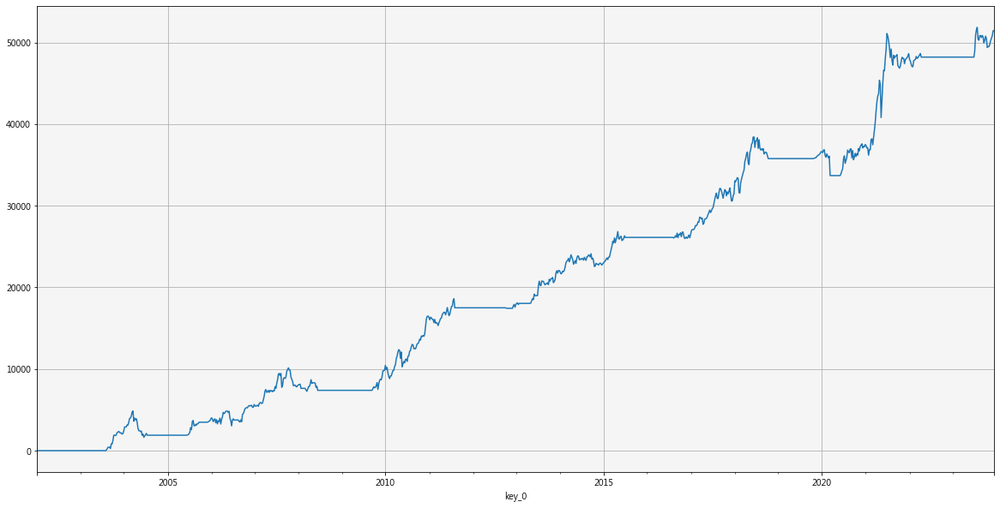

In [55]:
(tqt1*10).plot(figsize = (20,10),grid = True)

# 查詢式夏普損益

In [56]:
ys = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']

tqtall = pd.Series()
for x in ys :
    tqtm = (trrmsharpe*6).groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(x)].cumsum()
    tqtall = pd.concat([tqtall,tqtm])
tqtall = pd.DataFrame(tqtall)

In [57]:
tqtall = tqtall.reset_index(drop = False)
tqtall = tqtall.rename(columns = {'index':'datetime',0:'returns'})

In [58]:
tqtall['2003'] = np.where(tqtall.datetime<'2004-01-01',tqtall['returns'],np.nan)
tqtall['2004'] = np.where(((tqtall.datetime<'2005-01-01') & (tqtall.datetime>='2004-01-01')),tqtall['returns'],np.nan)
tqtall['2005'] = np.where(((tqtall.datetime<'2006-01-01') & (tqtall.datetime>='2005-01-01')),tqtall['returns'],np.nan)
tqtall['2006'] = np.where(((tqtall.datetime<'2007-01-01') & (tqtall.datetime>='2006-01-01')),tqtall['returns'],np.nan)
tqtall['2007'] = np.where(((tqtall.datetime<'2008-01-01') & (tqtall.datetime>='2007-01-01')),tqtall['returns'],np.nan)
tqtall['2008'] = np.where(((tqtall.datetime<'2009-01-01') & (tqtall.datetime>='2008-01-01')),tqtall['returns'],np.nan)
tqtall['2009'] = np.where(((tqtall.datetime<'2010-01-01') & (tqtall.datetime>='2009-01-01')),tqtall['returns'],np.nan)
tqtall['2010'] = np.where(((tqtall.datetime<'2011-01-01') & (tqtall.datetime>='2010-01-01')),tqtall['returns'],np.nan)
tqtall['2011'] = np.where(((tqtall.datetime<'2012-01-01') & (tqtall.datetime>='2011-01-01')),tqtall['returns'],np.nan)
tqtall['2012'] = np.where(((tqtall.datetime<'2013-01-01') & (tqtall.datetime>='2012-01-01')),tqtall['returns'],np.nan)
tqtall['2013'] = np.where(((tqtall.datetime<'2014-01-01') & (tqtall.datetime>='2013-01-01')),tqtall['returns'],np.nan)
tqtall['2014'] = np.where(((tqtall.datetime<'2015-01-01') & (tqtall.datetime>='2014-01-01')),tqtall['returns'],np.nan)
tqtall['2015'] = np.where(((tqtall.datetime<'2016-01-01') & (tqtall.datetime>='2015-01-01')),tqtall['returns'],np.nan)
tqtall['2016'] = np.where(((tqtall.datetime<'2017-01-01') & (tqtall.datetime>='2016-01-01')),tqtall['returns'],np.nan)
tqtall['2017'] = np.where(((tqtall.datetime<'2018-01-01') & (tqtall.datetime>='2017-01-01')),tqtall['returns'],np.nan)
tqtall['2018'] = np.where(((tqtall.datetime<'2019-01-01') & (tqtall.datetime>='2018-01-01')),tqtall['returns'],np.nan)
tqtall['2019'] = np.where(((tqtall.datetime<'2020-01-01') & (tqtall.datetime>='2019-01-01')),tqtall['returns'],np.nan)
tqtall['2020'] = np.where(((tqtall.datetime<'2021-01-01') & (tqtall.datetime>='2020-01-01')),tqtall['returns'],np.nan)
tqtall['2021'] = np.where(((tqtall.datetime<'2022-01-01') & (tqtall.datetime>='2021-01-01')),tqtall['returns'],np.nan)
tqtall['2022'] = np.where(((tqtall.datetime<'2023-01-01') & (tqtall.datetime>='2022-01-01')),tqtall['returns'],np.nan)
tqtall['2023'] = np.where(((tqtall.datetime<'2024-01-01') & (tqtall.datetime>='2023-01-01')),tqtall['returns'],np.nan)

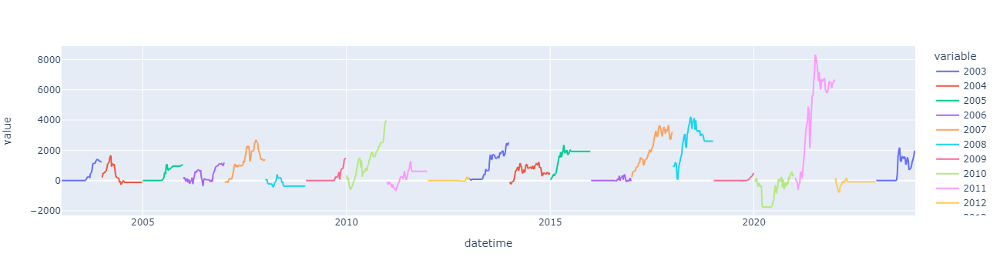

In [59]:
px.line(tqtall,x = 'datetime' ,y = ys)

# 整理夏普買賣訊01值

8.150959860383944
0.0
35.0


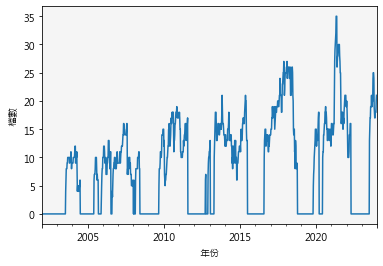

In [60]:
夏普1 = pzmsp.sort_index()
f2 = lambda x :float(x)
夏普2 = 夏普1.applymap(f2)
夏普3 = 夏普2.sum(axis=1)
夏普部位 =夏普3.groupby(pd.Grouper(freq='1W')).tail(1)
print(夏普部位.mean())
print(夏普部位.min())
print(夏普部位.max())
夏普部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('空方部位變化表.png')

# M夏普當週買進部位

In [61]:
M夏普持有部位 = 夏普2.loc[當週日期][夏普2.loc[當週日期] ==1]
M夏普買進 = 夏普2.loc[當週日期][(夏普2.loc[當週日期] ==1) & (夏普2.loc[前週日期] ==0)]
M夏普賣出 = 夏普2.loc[當週日期][(夏普2.loc[當週日期] ==0) & (夏普2.loc[前週日期] ==1)]
print("M夏普買進標的")
print(M夏普買進)
print("M夏普買進檔數" , len(M夏普買進))
print("M夏普持有部位數目" , len(M夏普持有部位))
print("M夏普賣出部位")
print(M夏普賣出)
print("M夏普賣出檔數" , len(M夏普賣出))
print('M夏普持有部位',M夏普持有部位)

M夏普買進標的
2548    1.0
Name: 2023-12-15 00:00:00, dtype: float64
M夏普買進檔數 1
M夏普持有部位數目 21
M夏普賣出部位
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
M夏普賣出檔數 0
M夏普持有部位 1519    1.0
1713    1.0
2211    1.0
2385    1.0
2449    1.0
2493    1.0
2539    1.0
2546    1.0
2548    1.0
3005    1.0
3017    1.0
3078    1.0
3702    1.0
5469    1.0
5536    1.0
6189    1.0
6191    1.0
6197    1.0
6201    1.0
9927    1.0
9930    1.0
Name: 2023-12-15 00:00:00, dtype: float64


# 夏普歷年損益

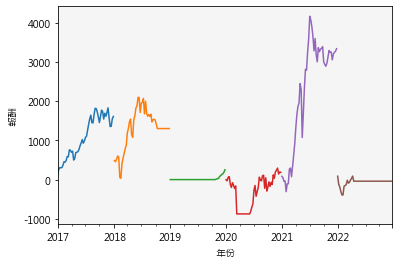

In [62]:
yl = ['2017','2018','2019','2020','2021','2022']
for h in yl :
    trrtms = trrmsharpe.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtmsfig = (trrtms*3).plot()
trrtmsfig = plt.gcf()

plt.xlabel("年份")
plt.ylabel("報酬")
trrtmsfig.savefig('M夏普歷年損益.png')

# 量能突破策略

100%|██████████| 1142/1142 [06:19<00:00,  3.01it/s]


Text(0, 0.5, 'Profit')

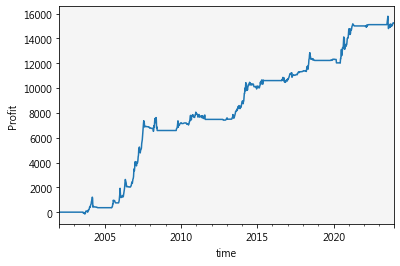

In [63]:
import talib
ERROR = []
trrv = pd.DataFrame()
pvz = pd.DataFrame()

for x in tqdm(SKTCRI):
    
    DDW[str(x)]['SMAX52'] = DDW[str(x)]["還原收盤價"].rolling(4).max()
    DDW[str(x)]["SMAX52S"] = DDW[str(x)]["MAX52"].shift(1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    VBS = 0
    VBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["成交金額(千)"].iloc[z]  > (DDW[str(x)]["成交金額(千)"].shift(1)*1.5).iloc[z] and DDW[str(x)]["成交金額(千)"].iloc[z] > 100000 \
        and DDW[str(x)]["收盤價"].iloc[z]  > (DDW[str(x)]["最高價"].shift(2)*1.1).iloc[z] and DDW[str(x)]['收盤價'].iloc[z] > DDW[str(x)]["SMAX52S"].iloc[z] \
        and DDW[str(x)]['大盤夏普'].iloc[z] > 0.4 and DDW[str(x)]['大盤夏普'].iloc[z] <1.3:
        
            VBS = 1

        elif  DDW[str(x)]["收盤價"].iloc[z] < DDW[str(x)]["最低價"].shift(2).iloc[z] or DDW[str(x)]['大盤夏普'].iloc[z]  < 0.3 :
            VBS = 0
            #buy.append("0")
        VBUY.append(VBS)
    DDW[str(x)]["VBUY"] = VBUY
    DDW[str(x)]["VBUYS"] = DDW[str(x)]["VBUY"].shift(1)
    pzb = DDW[str(x)]["VBUYS"]  
    pzb.name = str(x)
    pvzbs = DDW[str(x)]["VBUY"]
    pvzbs.name = str(x)
    DDW[str(x)]["RR"] = DDW[str(x)]["DR"] * DDW[str(x)]["VBUYS"].dropna().astype(int)
    PVT = DDW[str(x)]["RR"]
    PVT.name = str(x)
    if len(trr) == 0:
        trrv = PVT
    else:
        trrv = pd.merge(trrv,PVT,left_on = trrv.index,right_on = PVT.index,how = 'outer')
        trrv.set_index('key_0',inplace = True)
    if len(pz) == 0:
        pvz = pvzbs
    else:
        pvz = pd.merge(pvz,pvzbs,left_on = pvz.index,right_on = pvzbs.index,how = 'outer')
        pvz.set_index('key_0',inplace = True)

trrv1 =trrv.sort_index().sum(axis = 1).cumsum().plot()

plt.xlabel("time")
plt.ylabel("Profit")

<AxesSubplot:xlabel='key_0'>

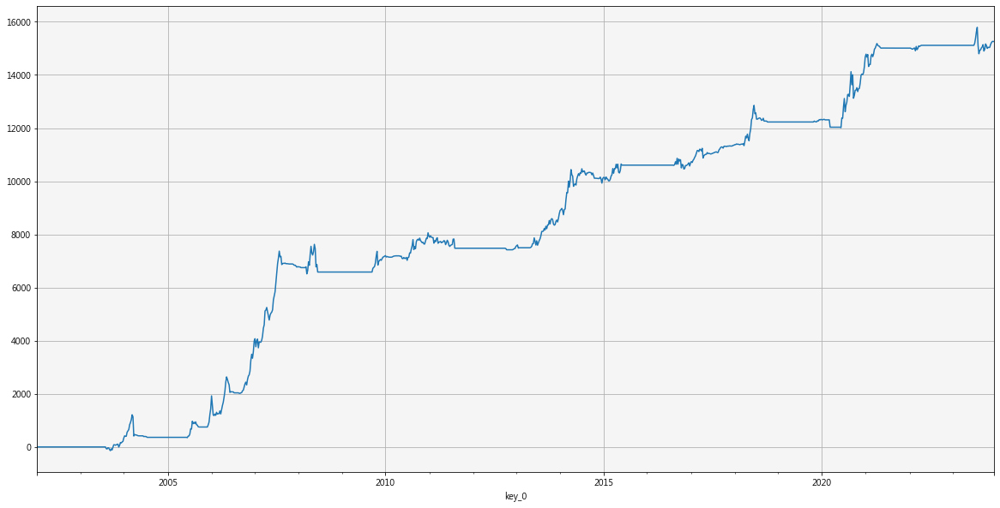

In [64]:
(trrv*1).sort_index().sum(axis = 1).cumsum().plot(figsize = (20,10),grid = True)

# 整理量能買賣訊01值

21.777486910994764
0.0
162.0


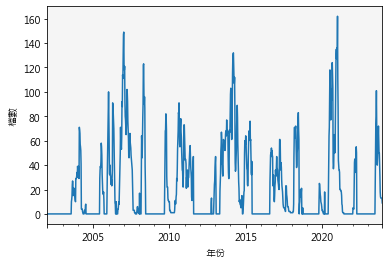

In [65]:
pvz1 = pvz.sort_index()
f4 = lambda x :float(x)
pvz2 = pvz1.applymap(f4)
pvz3 = pvz2.sum(axis=1)
pvz4 = pvz3.groupby(pd.Grouper(freq='1W')).tail(1)
print(pvz4.mean())
print(pvz4.min())
print(pvz4.max())
pvz4.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

# <font color="red">量能當週買進部位</font>

In [66]:
#當週日期 = '2022-08-26'
#前週日期 = '2022-08-19'

量能持有部位 = pvz2.loc[當週日期][pvz2.loc[當週日期] ==1]
量能買進 = pvz2.loc[當週日期][(pvz2.loc[當週日期] ==1) & (pvz2.loc[前週日期] ==0)]
量能賣出 = pvz2.loc[當週日期][(pvz2.loc[當週日期] ==0) & (pvz2.loc[前週日期] ==1)]
print("量能買進標的")
print(量能買進)
print("量能買進檔數" , len(量能買進))
print("量能持有部位數目" , len(量能持有部位))
print("量能賣出部位")
print(量能賣出)
print("量能賣出檔數" , len(量能賣出))

量能買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
量能買進檔數 0
量能持有部位數目 9
量能賣出部位
2233    0.0
2417    0.0
3444    0.0
3669    0.0
Name: 2023-12-15 00:00:00, dtype: float64
量能賣出檔數 4


# 低接策略

100%|██████████| 1142/1142 [07:16<00:00,  2.61it/s]


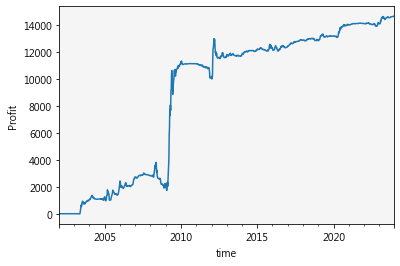

In [67]:
import talib
ERROR = []
trrkd = pd.DataFrame()
pzkd1 = pd.DataFrame()

for x in tqdm(SKTCRI):
    DDW[str(x)]["K"],DDW[str(x)]["D"] = talib.STOCH(DDW[str(x)]['最高價'], 
                              DDW[str(x)]['最低價'], 
                              DDW[str(x)]['收盤價'], 
                              fastk_period=52,
                              slowk_period=10,
                              slowk_matype=1,
                              slowd_period=10,
                              slowd_matype=1)
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    KDBS = 0
    KDBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]["K"].iloc[z] > DDW[str(x)]["D"].iloc[z] and DDW[str(x)]["K"].shift(1).iloc[z] < DDW[str(x)]["D"].shift(1).iloc[z] \
        and DDW[str(x)]['成交金額(千)'].iloc[z] < 500000 and DDW[str(x)]['融資維持率(%)'].iloc[z] > 150 \
        and DDW[str(x)]['D'].iloc[z] < 20 and DDW[str(x)]['還原收盤價'].iloc[z] < (DDW[str(x)]['MAX52S']*0.7).iloc[z] :
        
            KDBS = 1

        elif  DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(4).min().shift(1).iloc[z] :
            KDBS = 0
            #buy.append("0")
        KDBUY.append(KDBS)
    DDW[str(x)]["KDBUY"] = KDBUY
    DDW[str(x)]["KDBUYS"] = DDW[str(x)]["KDBUY"].shift(1)
    pzkd = DDW[str(x)]["KDBUYS"]  
    pzkd.name = str(x)
    pzkds = DDW[str(x)]["KDBUY"]
    pzkds.name = str(x)
    DDW[str(x)]["KDRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["KDBUYS"].dropna().astype(int)
    PVKD= DDW[str(x)]["KDRR"]
    PVKD.name = str(x)
    if len(trrkd) == 0:
        trrkd = PVKD
    else:
        trrkd = pd.merge(trrkd,PVKD,left_on = trrkd.index,right_on = PVKD.index,how = 'outer')
        trrkd.set_index('key_0',inplace = True)
    if len(pzkd) == 0:
        pzkd1 = pzkds
    else:
        pzkd1 = pd.merge(pzkd1,pzkds,left_on = pzkd1.index,right_on = pzkds.index,how = 'outer')
        pzkd1.set_index('key_0',inplace = True)

trrkd1 =trrkd.sort_index().sum(axis = 1).cumsum().plot()

plt.xlabel("time")
plt.ylabel("Profit")
plt.savefig('低接損益')

# 整理低接買賣訊01值

18.49389179755672
0.0
185.0


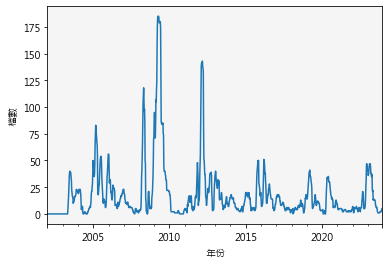

In [68]:
KD1 = pzkd1.sort_index()
f6 = lambda x :float(x)
KD2 = KD1.applymap(f6)
KD3 = KD2.sum(axis=1)
KD部位 =KD3.groupby(pd.Grouper(freq='1W')).tail(1)
print(KD部位.mean())
print(KD部位.min())
print(KD部位.max())
KD部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('低接部位變化表.png')

# 低接當週買進部位

In [69]:

低接持有部位 = KD2.loc[當週日期][KD2.loc[當週日期] ==1]
低接買進 = KD2.loc[當週日期][(KD2.loc[當週日期] ==1) & (KD2.loc[前週日期] ==0)]
低接賣出 = KD2.loc[當週日期][(KD2.loc[當週日期] ==0) & (KD2.loc[前週日期] ==1)]
print("低接買進標的")
print(低接買進)
print("低接買進檔數" , len(低接買進))
print("低接持有部位數目" , len(低接持有部位))
print("低接賣出部位")
print(低接賣出)
print("低接賣出檔數" , len(低接賣出))

低接買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
低接買進檔數 0
低接持有部位數目 5
低接賣出部位
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
低接賣出檔數 0


# 融資爆發策略


In [70]:
import talib
ERROR = []
trrmm = pd.DataFrame()
pzmm = pd.DataFrame()
pzmm1 = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    MMBS = 0
    MMBUY =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['融資維持率(%)'].iloc[z] > 170 and DDW[str(x)]['融資維持率(%)'].shift(1).iloc[z] < 170  \
        and  DDW[str(x)]['成交金額(千)'].iloc[z] < 250000 and DDW[str(x)]['K'].iloc[z] > 50 and DDW[str(x)]['資使用率'].iloc[z] < 15 and  DDW[str(x)]['成交金額(千)'].iloc[z] > 10000 \
        and  DDW[str(x)]['大盤夏普'].shift(1).iloc[z] < 1 :
            MMBS = 1

        elif    (DDW[str(x)]['融資維持率(%)'].shift(1).iloc[z] < 160) or \
         (DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['4MA'].iloc[z] ):
            MMBS = 0
            #buy.append("0")
        MMBUY.append(MMBS)
    DDW[str(x)]["MMBUY"] = MMBUY
    DDW[str(x)]["MMBUYS"] = DDW[str(x)]["MMBUY"].shift(1)
    pzmm = DDW[str(x)]["MMBUYS"]  
    pzmm.name = str(x)
    pzmms = DDW[str(x)]["MMBUY"]
    pzmms.name = str(x)
    DDW[str(x)]["MMRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["MMBUYS"].dropna().astype(int)
    PVMM= DDW[str(x)]["MMRR"]
    PVMM.name = str(x)
    if len(trrmm) == 0:
        trrmm = PVMM
    else:
        trrmm = pd.merge(trrmm,PVMM,left_on = trrmm.index,right_on = PVMM.index,how = 'outer')
        trrmm.set_index('key_0',inplace = True)
    if len(pzmm) == 0:
        pzmm1 = pzmms
    else:
        pzmm1 = pd.merge(pzmm1,pzmms,left_on = pzmm1.index,right_on = pzmms.index,how = 'outer')
        pzmm1.set_index('key_0',inplace = True)

#trrmm1 =trrmm.sort_index().sum(axis = 1).cumsum().plot()

#plt.xlabel("time")
#plt.ylabel("Profit")


100%|██████████| 1142/1142 [05:14<00:00,  3.63it/s]


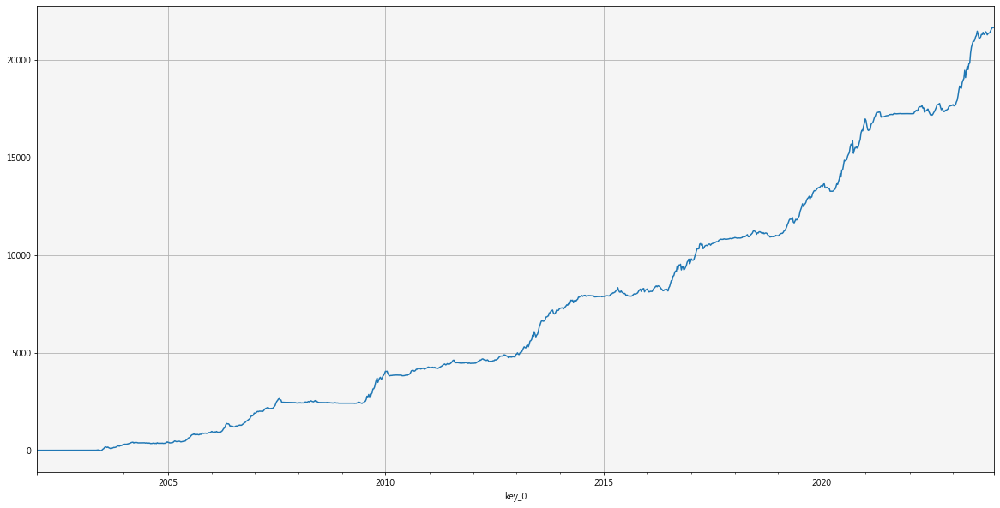

In [71]:
trrmm1 =trrmm.sort_index().sum(axis = 1).cumsum().plot(figsize=(20,10),grid = True)

Text(0, 0.5, '報酬')

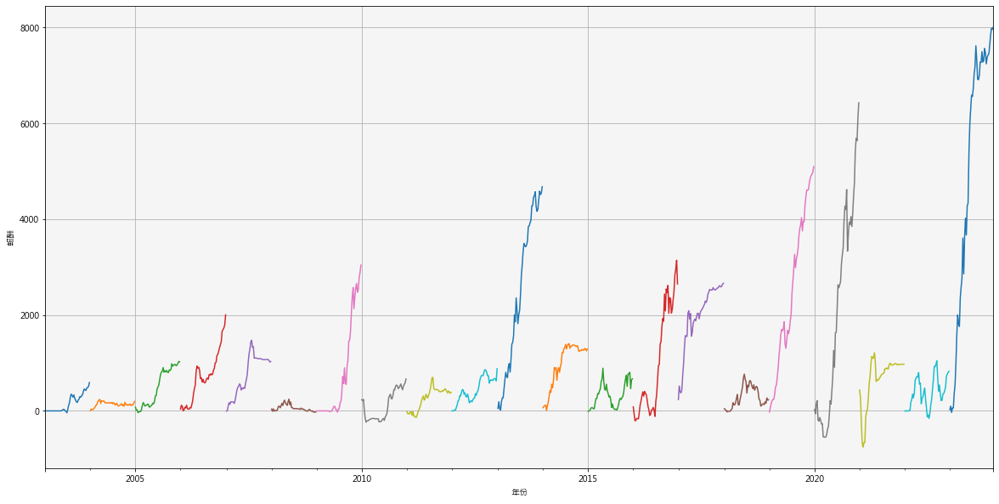

In [72]:
ymm = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in ymm :
    trrmmy = trrmm.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmmy1 = (trrmmy*2).plot(figsize = (20,10),grid = True)


plt.xlabel("年份")
plt.ylabel("報酬")


# 查詢式融資損益

In [73]:
ymm = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
trrmall = pd.Series()
for h in ymm :
    trrmmy = trrmm.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmall = pd.concat([trrmall,trrmmy*2])
trrmall = pd.DataFrame(trrmall)

In [74]:
trrmall = trrmall.reset_index(drop = False)
trrmall = trrmall.rename(columns = {'index':'datetime',0:'returns'})

In [75]:
trrmall['2003'] = np.where(trrmall.datetime<'2004-01-01',trrmall['returns'],np.nan)
trrmall['2004'] = np.where(((trrmall.datetime<'2005-01-01') & (trrmall.datetime>='2004-01-01')),trrmall['returns'],np.nan)
trrmall['2005'] = np.where(((trrmall.datetime<'2006-01-01') & (trrmall.datetime>='2005-01-01')),trrmall['returns'],np.nan)
trrmall['2006'] = np.where(((trrmall.datetime<'2007-01-01') & (trrmall.datetime>='2006-01-01')),trrmall['returns'],np.nan)
trrmall['2007'] = np.where(((trrmall.datetime<'2008-01-01') & (trrmall.datetime>='2007-01-01')),trrmall['returns'],np.nan)
trrmall['2008'] = np.where(((trrmall.datetime<'2009-01-01') & (trrmall.datetime>='2008-01-01')),trrmall['returns'],np.nan)
trrmall['2009'] = np.where(((trrmall.datetime<'2010-01-01') & (trrmall.datetime>='2009-01-01')),trrmall['returns'],np.nan)
trrmall['2010'] = np.where(((trrmall.datetime<'2011-01-01') & (trrmall.datetime>='2010-01-01')),trrmall['returns'],np.nan)
trrmall['2011'] = np.where(((trrmall.datetime<'2012-01-01') & (trrmall.datetime>='2011-01-01')),trrmall['returns'],np.nan)
trrmall['2012'] = np.where(((trrmall.datetime<'2013-01-01') & (trrmall.datetime>='2012-01-01')),trrmall['returns'],np.nan)
trrmall['2013'] = np.where(((trrmall.datetime<'2014-01-01') & (trrmall.datetime>='2013-01-01')),trrmall['returns'],np.nan)
trrmall['2014'] = np.where(((trrmall.datetime<'2015-01-01') & (trrmall.datetime>='2014-01-01')),trrmall['returns'],np.nan)
trrmall['2015'] = np.where(((trrmall.datetime<'2016-01-01') & (trrmall.datetime>='2015-01-01')),trrmall['returns'],np.nan)
trrmall['2016'] = np.where(((trrmall.datetime<'2017-01-01') & (trrmall.datetime>='2016-01-01')),trrmall['returns'],np.nan)
trrmall['2017'] = np.where(((trrmall.datetime<'2018-01-01') & (trrmall.datetime>='2017-01-01')),trrmall['returns'],np.nan)
trrmall['2018'] = np.where(((trrmall.datetime<'2019-01-01') & (trrmall.datetime>='2018-01-01')),trrmall['returns'],np.nan)
trrmall['2019'] = np.where(((trrmall.datetime<'2020-01-01') & (trrmall.datetime>='2019-01-01')),trrmall['returns'],np.nan)
trrmall['2020'] = np.where(((trrmall.datetime<'2021-01-01') & (trrmall.datetime>='2020-01-01')),trrmall['returns'],np.nan)
trrmall['2021'] = np.where(((trrmall.datetime<'2022-01-01') & (trrmall.datetime>='2021-01-01')),trrmall['returns'],np.nan)
trrmall['2022'] = np.where(((trrmall.datetime<'2023-01-01') & (trrmall.datetime>='2022-01-01')),trrmall['returns'],np.nan)
trrmall['2023'] = np.where(((trrmall.datetime<'2024-01-01') & (trrmall.datetime>='2023-01-01')),trrmall['returns'],np.nan)

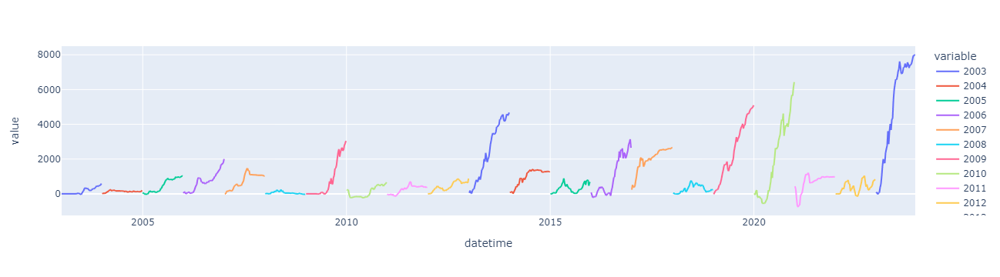

In [76]:
px.line(trrmall, x = 'datetime', y= ymm)

# 整理融資爆發買賣訊01值

31.457242582897035
0.0
187.0


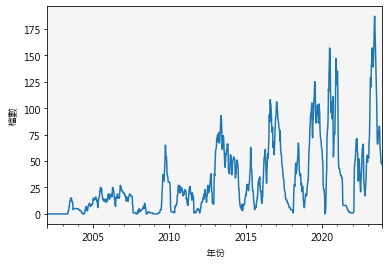

In [77]:
MM1 = pzmm1.sort_index()
f12 = lambda x :float(x)
MM2 = MM1.applymap(f12)
MM3 = MM2.sum(axis=1)
MM部位 =MM3.groupby(pd.Grouper(freq='1W')).tail(1)
print(MM部位.mean())
print(MM部位.min())
print(MM部位.max())
MM部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

# 融資爆發當週買進部位

In [78]:
MM持有部位 = MM2.loc[當週日期][(MM2.loc[當週日期]==1)]
MM買進 = MM2.loc[當週日期][(MM2.loc[當週日期]==1) & (MM2.loc[前週日期]==0)]
MM賣出 = MM2.loc[當週日期][(MM2.loc[當週日期]==0) & (MM2.loc[前週日期]==1)]
print("MM買進標的")
print(MM買進)
print("MM買進檔數" , len(MM買進))
print("MM持有部位數目" , len(MM持有部位))
print("MM賣出部位")
print(MM賣出)
print("MM賣出檔數" , len(MM賣出))

MM買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
MM買進檔數 0
MM持有部位數目 46
MM賣出部位
5906    0.0
6281    0.0
Name: 2023-12-15 00:00:00, dtype: float64
MM賣出檔數 2


In [79]:
DDW['6776']['大盤夏普'].tail(10)

日期
2023-10-13    1.339803
2023-10-20    1.452287
2023-10-27    1.494110
2023-11-03    1.667760
2023-11-10    2.009448
2023-11-17    2.039498
2023-11-24    1.913699
2023-12-01    1.446007
2023-12-08    1.423017
2023-12-15    1.423017
Freq: W-FRI, Name: 大盤夏普, dtype: float64

# X策略

100%|██████████| 1142/1142 [05:52<00:00,  3.24it/s]


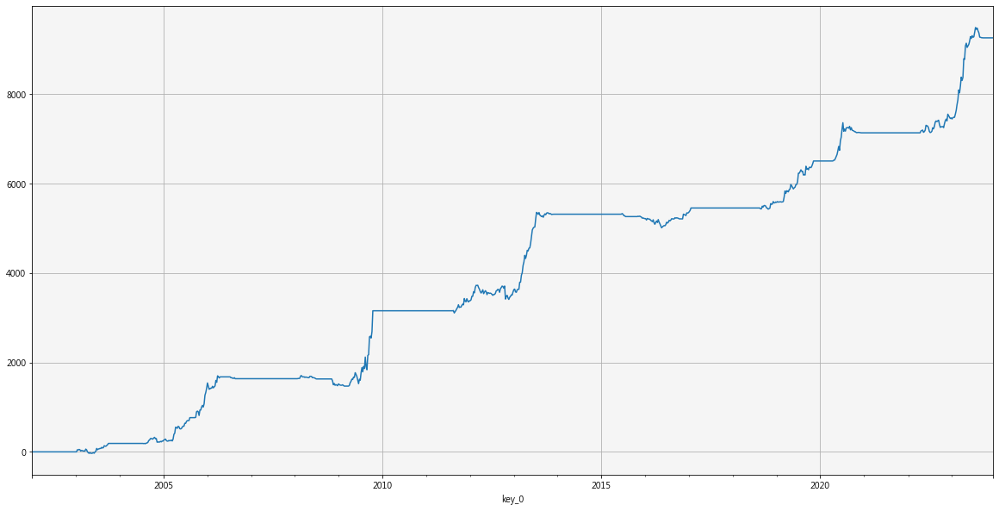

In [80]:
import talib
ERROR = []
trrmmstop = pd.DataFrame()
pzmmstop = pd.DataFrame()
pzmm1stop = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
    DDW[str(x)]["4MA"] = DDW[str(x)]["4MA"].shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    MMBSstop = 0
    MMBUYstop =[]
    for z in range(len(DDW[str(x)])):

        if DDW[str(x)]['融資維持率(%)'].iloc[z] == 0 and DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["MAX52S"].iloc[z] and DDW[str(x)]['資使用率'].iloc[z] == 0 \
        and DDW[str(x)]['收盤價'].iloc[z] > 10 and  DDW[str(x)]['成交金額(千)'].iloc[z] < 100000 and DDW[str(x)]['成交金額(千)'].iloc[z] > 20000 \
        and DDW[str(x)]['大盤夏普'].iloc[z] < 0.4 :
        
        
            MMBSstop = 1

        elif (DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(5).min().shift(1).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['4MA'].iloc[z]) \
        or DDW[str(x)]['大盤夏普'].iloc[z] > 1.3:
            MMBSstop = 0
            #buy.append("0")
        MMBUYstop.append(MMBSstop)
    DDW[str(x)]["MMBUYSTOP"] = MMBUYstop
    DDW[str(x)]["MMBUYSSTOP"] = DDW[str(x)]["MMBUYSTOP"].shift(1)
    pzmmstop = DDW[str(x)]["MMBUYSSTOP"]  
    pzmmstop.name = str(x)
    pzmmsstop = DDW[str(x)]["MMBUYSTOP"]
    pzmmsstop.name = str(x)
    DDW[str(x)]["MMRRSTOP"] = DDW[str(x)]["DR"] * DDW[str(x)]["MMBUYSSTOP"].dropna().astype(int)
    PVMMstop= DDW[str(x)]["MMRRSTOP"]
    PVMMstop.name = str(x)
    if len(trrmmstop) == 0:
        trrmmstop = PVMMstop
    else:
        trrmmstop = pd.merge(trrmmstop,PVMMstop,left_on = trrmmstop.index,right_on = PVMMstop.index,how = 'outer')
        trrmmstop.set_index('key_0',inplace = True)
    if len(pzmmstop) == 0:
        pzmm1stop = pzmmsstop
    else:
        pzmm1stop = pd.merge(pzmm1stop,pzmmsstop,left_on = pzmm1stop.index,right_on = pzmmsstop.index,how = 'outer')
        pzmm1stop.set_index('key_0',inplace = True)
trrmm1stop =(trrmmstop*3).sort_index().sum(axis = 1).cumsum().plot(figsize=(20,10),grid = True)

Text(0, 0.5, '報酬')

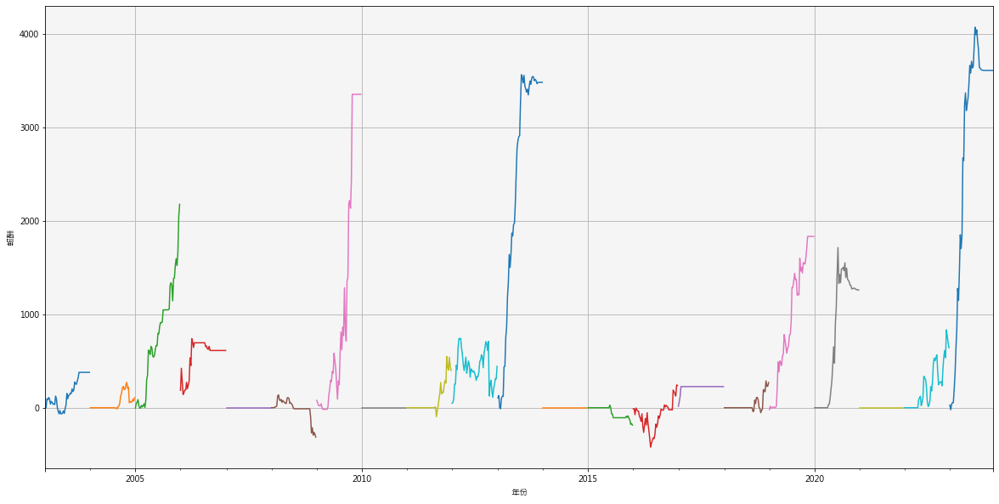

In [81]:
ymmstop = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in ymmstop :
    trrmmystop = (trrmmstop*3).groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrmmy1stop = (trrmmystop*2).plot(figsize = (20,10),grid = True)


plt.xlabel("年份")
plt.ylabel("報酬")

2.357766143106457
0.0
23.0


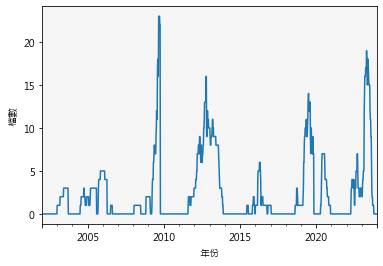

In [82]:
MM1stop = pzmm1stop.sort_index()
f12stop = lambda x :float(x)
MM2stop = MM1stop.applymap(f12stop)
MM3stop = MM2stop.sum(axis=1)
MMstop部位 =MM3stop.groupby(pd.Grouper(freq='1W')).tail(1)
print(MMstop部位.mean())
print(MMstop部位.min())
print(MMstop部位.max())
MMstop部位.plot()
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('量能部位變化表.png')

In [83]:
MMstop持有部位 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==1)]
MMstop買進 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==1) & (MM2stop.loc[前週日期]==0)]
MMstop賣出 = MM2stop.loc[當週日期][(MM2stop.loc[當週日期]==0) & (MM2stop.loc[前週日期]==1)]
print("MMstop買進標的")
print(MMstop買進)
print("MMstop買進檔數" , len(MMstop買進))
print("MMstop持有部位數目" , len(MMstop持有部位))
print("MMstop賣出部位")
print(MMstop賣出)
print("MMstop賣出檔數" , len(MMstop賣出))


MMstop買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
MMstop買進檔數 0
MMstop持有部位數目 0
MMstop賣出部位
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
MMstop賣出檔數 0


In [84]:
MMstop持有部位

Series([], Name: 2023-12-15 00:00:00, dtype: float64)

In [85]:
DDW['2755'].tail(10)

,開盤價,最高價,最低價,收盤價,成交金額(千),資使用率,當沖比率,週轉率(%),融資維持率(%),還原收盤價,投信持股比率(%),投信持股成本,外資持股比率(%),外資持股成本,投信持股市值(百萬),是否為ETF成分股,買張1(券商),買張2(券商),買張3(券商),賣張1(券商),賣張2(券商),賣張3(券商),MAX52,MAX52S,4MA,4MAS,DR,大盤夏普,一籃子夏普,KPBUY,KPBUYS,KPRR,LOW5,SMAX3,LOW5S,4SELLMA,COVERMA,SCHECKMA,4SELLMAS,30SELLMA,60SELLMA,SELL,SELLS,SRR,SELLETF,SELLSETF,SRRETF,rolling_ret,rolling_std,sharpe105,sharp1,BUYQT,BUYQTS,QTRR,SMAX52,SMAX52S,VBUY,VBUYS,RR,K,D,KDBUY,KDBUYS,KDRR,MMBUY,MMBUYS,MMRR,MMBUYSTOP,MMBUYSSTOP,MMRRSTOP
日期,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2023-10-13,116.5,116.5,112.0,114.5,9274.0,0.23,0.0,0.04,165.610901,114.5,0.0,0.0,0.66,123.57,0.0,F,富邦-台南,凱基-台北,新光-高雄,元大,永豐金-中壢,合庫-三重,150.0,150.0,116.3,116.3,-2.136752,1.339803,1.339803,0,0.0,-0.0,114.5,119.5,117.0,115.500,116.571429,133.850,116.250,122.3390,122.3390,0,0.0,-0.0,0,0.0,-0.0,0.014844,0.054506,0.272328,0.427327,0,0.0,-0.0,117.5,150.0,0,0.0,-0.0,38.777855,47.993629,0,0.0,-0.0,0,0.0,-0.0,0,0.0,-0.0
2023-10-20,114.5,115.0,111.5,111.5,8202.0,0.23,0.0,0.04,161.515793,111.5,0.0,0.0,0.65,123.53,0.0,F,臺銀-臺南,台新,凱基-竹科,新光-台南,台灣企銀,玉山-台南,150.0,150.0,115.9,115.9,-2.620087,1.452287,1.452287,0,0.0,-0.0,111.5,116.5,114.5,115.125,115.357143,132.225,115.500,122.7005,122.7005,0,0.0,-0.0,0,0.0,-0.0,0.014098,0.054802,0.257246,0.417220,0,0.0,-0.0,117.5,150.0,0,0.0,-0.0,37.465324,46.079392,0,0.0,-0.0,0,0.0,-0.0,0,0.0,-0.0
2023-10-27,111.5,113.0,108.0,110.0,10454.0,0.27,0.0,0.05,160.505600,110.0,0.0,0.0,0.63,123.25,0.0,F,群益金鼎-延平,臺銀-臺南,華南永昌-古亭,國泰-松江,元大-員林,宏遠-台中,150.0,150.0,114.7,114.7,-1.345291,1.494110,1.494110,0,0.0,-0.0,110.0,115.0,111.5,113.250,114.428571,130.000,115.125,122.6065,122.6065,0,0.0,-0.0,0,0.0,-0.0,0.015280,0.053492,0.285645,0.430960,0,0.0,-0.0,117.0,150.0,0,0.0,-0.0,36.184038,44.280237,0,0.0,-0.0,0,0.0,-0.0,0,0.0,-0.0
2023-11-03,113.0,122.0,108.0,118.0,19136.0,0.29,0.0,0.33,171.780502,118.0,0.0,0.0,0.61,122.81,0.0,F,凱基-桃園,台中銀-員林,元富-林園,康和-石牌,宏遠-台中,凱基-桃園,150.0,150.0,114.1,114.1,7.272727,1.667760,1.667760,0,0.0,0.0,110.0,122.0,110.0,113.500,114.500000,127.550,113.250,122.4600,122.4600,0,0.0,0.0,0,0.0,0.0,0.015691,0.053856,0.291360,0.421615,0,0.0,0.0,118.0,150.0,0,0.0,0.0,35.926145,42.761311,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0
2023-11-10,117.0,122.5,116.0,119.0,20520.0,0.33,0.0,0.16,170.572205,119.0,0.0,0.0,0.59,122.66,0.0,F,台新,凱基-桃園,美好-台南,元大-蘆洲,台新-中壢,台中銀-員林,150.0,150.0,114.2,114.2,0.847458,2.009448,2.009448,0,0.0,0.0,118.0,122.5,110.0,114.625,115.357143,124.500,113.500,121.8930,121.8930,0,0.0,0.0,0,0.0,0.0,0.016175,0.053672,0.301373,0.418847,0,0.0,0.0,119.0,150.0,0,0.0,0.0,35.811231,41.497660,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0
2023-11-17,121.5,122.5,116.5,120.5,18896.0,0.21,0.0,0.08,172.163193,120.5,0.0,0.0,0.60,122.57,0.0,F,合庫- 台中,致和-佳里,華南永昌-板橋,凱基-基隆,台灣企銀-北高雄,台新,150.0,150.0,114.6,114.6,1.260504,2.039498,2.039498,0,0.0,0.0,119.0,122.5,118.0,116.875,115.785714,121.075,114.625,121.0750,121.0750,0,0.0,0.0,0,0.0,0.0,0.016997,0.053274,0.319053,0.417133,0,0.0,0.0,120.5,150.0,0,0.0,0.0,35.912967,40.482261,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0
2023-11-24,120.5,120.5,117.5,118.0,10289.0,0.23,0.0,0.03,167.891693,118.0,0.0,0.0,0.61,122.46,0.0,F,群益金鼎-延平,元富-吉利,致和-佳里,台新,臺銀-臺南,富邦-員林,150.0,150.0,115.8,115.8,-2.074689,1.913699,1.913699,0,0.0,-0.0,118.0,122.5,119.0,118.875,115.928571,119.475,116.875,119.4750,119.4750,0,0.0,-0.0,0,0.0,-0.0,0.015614,0.053303,0.292930,0.417249,0,0.0,-0.0,120.5,150.0,0,0.0,-0.0,35.272184,39.534975,0,0.0,-0.0,0,0.0,-0.0,0,0.0,-0.0
2023-12-01,118.0,121.0,118.0,118.5,10526.0,0.28,0.0,0.07,167.182907,118.5,0.0,0.0,0.62,122.31,0.0,F,凱基-台北,群益金鼎-延平,國泰-敦南,統一-員林,統一-士林,富邦-羅東,150.0,150.0,117.1,117.1,0.423729,1.446007,1.446007,0,0.0,0.0,118.0,121.0,118.0,119.000,116.500000,118.275,118.875,118.2750,118.2750,0,0.0,0.0,0,0.0,0.0,0.015546,0.053316,0.291580,0.419002,0,0.0,0.0,120.5,150.0,0,0.0,0.0,34.771846,38.668951,0,0.0,0.0,0,0.0,0.0,0,0.0,0.0
2023-12-08,118.5,121.5,117.0,117.5,10712.0,0.27,0.0,0.04,166.037094,117.5,0.0,0.0,0.58,122.27,0.0,F,亞東-板橋,新光-新竹,第一金-華江,宏遠-台南,台新,凱基-台北,150.0,150.0,118.8,118.8,-0.843

# 外資策略

100%|██████████| 1142/1142 [03:43<00:00,  5.12it/s]


Text(0, 0.5, 'Profit')

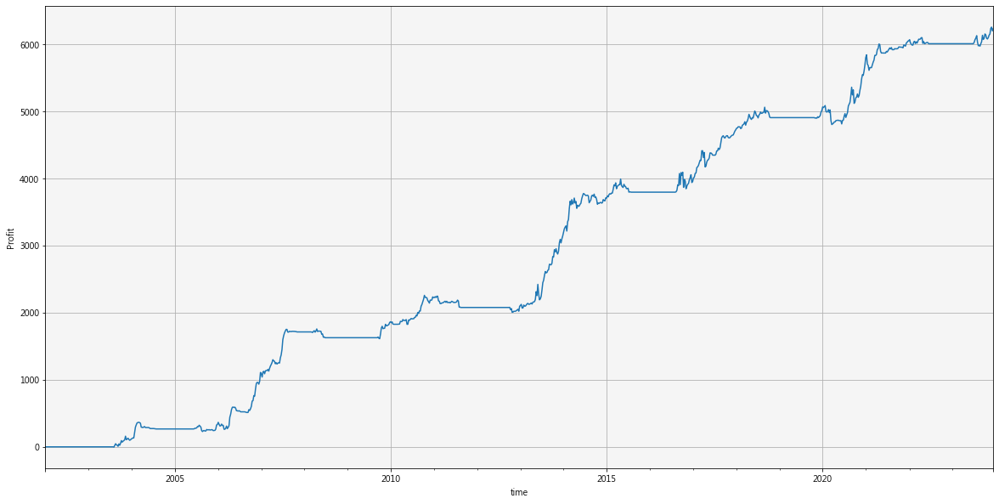

In [86]:
import talib
ERROR = []
trrtest = pd.DataFrame()
pztest = pd.DataFrame()
pztest1 = pd.DataFrame()
for x in tqdm(SKTCRI):
    
    
    DDW[str(x)]["FF4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=10, matype=0)
    DDW[str(x)]["FF4MAS"] = DDW[str(x)]["FF4MA"].shift(1)
    DDW[str(x)]['FFMAX'] = DDW[str(x)]["還原收盤價"].rolling(30).max()
    DDW[str(x)]["FFMAXS"] = DDW[str(x)]["FFMAX"].shift(1)
    DDW[str(x)]["FFMINS"] = DDW[str(x)]["最低價"].rolling(10).min().shift(1)
    DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
    #DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
    TESTBS = 0
    TESTBUY =[]
    for z in range(len(DDW[str(x)])):

        if  DDW[str(x)]['外資持股比率(%)'].iloc[z] > DDW[str(x)]['外資持股比率(%)'].shift(1).iloc[z] and DDW[str(x)]['外資持股比率(%)'].iloc[z] >10 \
        and  DDW[str(x)]['成交金額(千)'].iloc[z] < 700000 and DDW[str(x)]['還原收盤價'].iloc[z] > DDW[str(x)]['FFMAXS'].iloc[z] and  DDW[str(x)]['成交金額(千)'].iloc[z] > 50000 \
        and DDW[str(x)]['外資持股比率(%)'].iloc[z] > DDW[str(x)]['外資持股比率(%)'].shift(10).iloc[z] and  DDW[str(x)]['大盤夏普'].iloc[z] >0.4 :
            TESTBS = 1

        elif DDW[str(x)]['還原收盤價'].iloc[z] < (DDW[str(x)]['FF4MA'].iloc[z]) or DDW[str(x)]['收盤價'].iloc[z] < (DDW[str(x)]['FFMINS'].iloc[z]) \
        or (DDW[str(x)]['外資持股比率(%)'].iloc[z] < DDW[str(x)]['外資持股比率(%)'].shift(5).iloc[z] and DDW[str(x)]['還原收盤價'].iloc[z] < DDW[str(x)]['還原收盤價'].shift(3).iloc[z]) \
        or   DDW[str(x)]['大盤夏普'].iloc[z] >1.5 :
            TESTBS = 0
            #buy.append("0")
        TESTBUY.append(TESTBS)
    DDW[str(x)]["TESTBUY"] = TESTBUY
    DDW[str(x)]["TESTBUYS"] = DDW[str(x)]["TESTBUY"].shift(1)
    pztests = DDW[str(x)]["TESTBUYS"]  
    pztests.name = str(x)
    pztest = DDW[str(x)]["TESTBUY"]
    pztest.name = str(x)
    DDW[str(x)]["TESTRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["TESTBUYS"].dropna().astype(int)
    PVTEST= DDW[str(x)]["TESTRR"]
    PVTEST.name = str(x)
    if len(trrtest) == 0:
        trrtest = PVTEST
    else:
        trrtest = pd.merge(trrtest,PVTEST,left_on = trrtest.index,right_on = PVTEST.index,how = 'outer')
        trrtest.set_index('key_0',inplace = True)
    if len(pztest) == 0:
        pztest1 = pztest
    else:
        pztest1 = pd.merge(pztest1,pztest,left_on = pztest1.index,right_on = pztest.index,how = 'outer')
        pztest1.set_index('key_0',inplace = True)

trrtest1 =trrtest.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

plt.xlabel("time")
plt.ylabel("Profit")


# 整理外資買賣訊01值

11.042757417102967
0.0
71.0


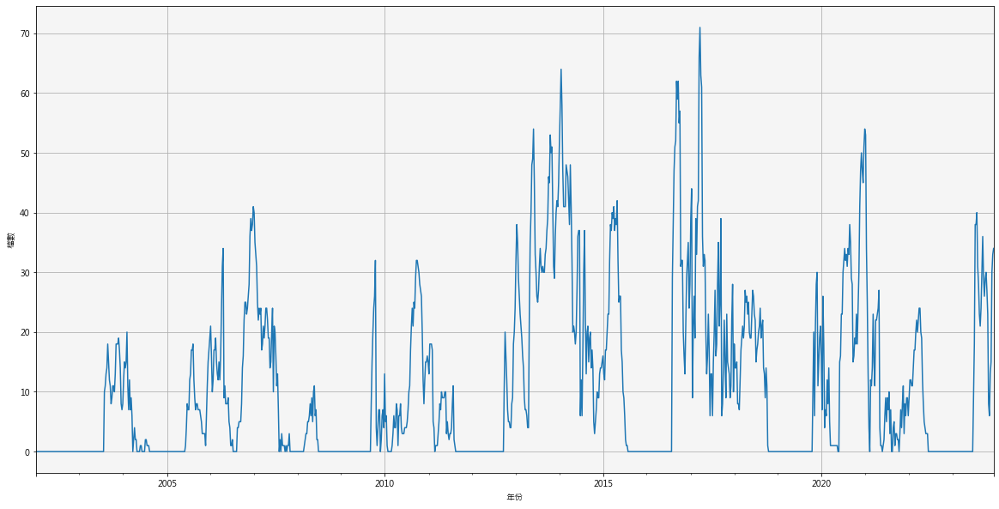

In [87]:
外資1 = pztest1.sort_index()
fsit = lambda x :float(x)
外資2 = 外資1.applymap(fsit)
外資3 = 外資2.sum(axis=1)
外資4 = 外資3.groupby(pd.Grouper(freq='1W')).tail(1)
print(外資4.mean())
print(外資4.min())
print(外資4.max())
外資4.plot(figsize=(20, 10),grid = True)
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig('外資部位變化表.png')

# 外資當週買進部位

In [88]:
外資持有部位 = 外資2.loc[當週日期][外資2.loc[當週日期] ==1]
外資買進 = 外資2.loc[當週日期][(外資2.loc[當週日期] ==1) & (外資2.loc[前週日期] ==0)]
外資賣出 = 外資2.loc[當週日期][(外資2.loc[當週日期] ==0) & (外資2.loc[前週日期] ==1)]
print("外資買進標的")
print(外資買進)
print("外資買進檔數" , len(外資買進))
print("外資持有部位數目" , len(外資持有部位))
print("外資賣出部位")
print(外資賣出)
print("外資賣出檔數" , len(外資賣出))

外資買進標的
1521    1.0
2347    1.0
3019    1.0
6156    1.0
6807    1.0
8426    1.0
Name: 2023-12-15 00:00:00, dtype: float64
外資買進檔數 6
外資持有部位數目 34
外資賣出部位
2233    0.0
3531    0.0
5225    0.0
6703    0.0
8442    0.0
Name: 2023-12-15 00:00:00, dtype: float64
外資賣出檔數 5


Text(0, 0.5, '報酬')

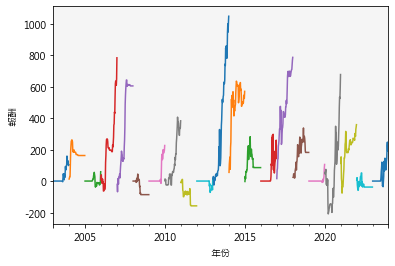

In [89]:
yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
for h in yl :
    trrtestw = trrtest.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
    trrtestfig = (trrtestw).plot()


plt.xlabel("年份")
plt.ylabel("報酬")


In [90]:
print("外資持有部位數目")
print(list(外資持有部位.index))

外資持有部位數目
['1229', '1521', '1532', '1722', '2006', '2029', '2347', '2374', '2441', '2451', '2496', '2520', '2548', '2636', '3015', '3019', '3086', '3213', '3413', '5471', '5534', '6156', '6189', '6683', '6807', '8163', '8271', '8426', '8467', '9911', '9917', '9924', '9933', '9938']


<AxesSubplot:xlabel='日期'>

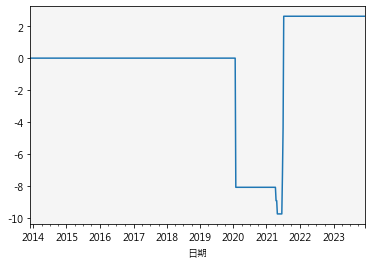

In [91]:
DDW['5289']['TESTRR'].cumsum().plot()

# 強勢短出關鍵點

In [92]:
# import talib
# ERROR = []
# strr = pd.DataFrame()
# spz = pd.DataFrame()

# for x in tqdm(SKTCRI):
    
#     DDW[str(x)]['MAX52'] = DDW[str(x)]["還原收盤價"].rolling(52).max()
#     DDW[str(x)]["MAX52S"] = DDW[str(x)]["MAX52"].shift(1)
#     DDW[str(x)]["4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
#     DDW[str(x)]["4MAS"] = DDW[str(x)]["4MA"].shift(1)
#     DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
#     DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
#     DDW[str(x)]['一籃子夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
#     sKPBS = 0
#     sKPBUY =[]
#     for z in range(len(DDW[str(x)])):

#         if DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["MAX52S"].iloc[z] and  DDW[str(x)]["成交金額(千)"].iloc[z] > 50000 and  DDW[str(x)]["資使用率"].iloc[z] < 15 \
#         and DDW[str(x)]["成交金額(千)"].shift(1).iloc[z] > 20000 and DDW[str(x)]["還原收盤價"].iloc[z] < 200 and DDW[str(x)]['大盤夏普'].iloc[z] >0.5  :
        
#             sKPBS = 1

#         elif  DDW[str(x)]['收盤價'].iloc[z] < DDW[str(x)]['最低價'].rolling(3).min().shift(1).iloc[z]:
#         #or  DDW[str(x)]['大盤夏普'].iloc[z] >1.4  :((DDW[str(x)]["4MA"].iloc[z] < DDW[str(x)]["4MAS"].iloc[z] and
#             sKPBS = 0
#             #buy.append("0")
#         sKPBUY.append(sKPBS)
#     DDW[str(x)]["sKPBUY"] = sKPBUY
#     DDW[str(x)]["sKPBUYS"] = DDW[str(x)]["sKPBUY"].shift(1)
#     spzb = DDW[str(x)]["sKPBUYS"]  
#     spzb.name = str(x)
#     spzbs = DDW[str(x)]["sKPBUY"]
#     spzbs.name = str(x)
#     DDW[str(x)]["sKPRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["sKPBUYS"].dropna().astype(int)
#     sPT = DDW[str(x)]["sKPRR"]
#     sPT.name = str(x)
#     if len(strr) == 0:
#         strr = sPT
#     else:
#         strr = pd.merge(strr,sPT,left_on = strr.index,right_on = sPT.index,how = 'outer')
#         strr.set_index('key_0',inplace = True)
#     if len(spz) == 0:
#         spz = spzbs
#     else:
#         spz = pd.merge(spz,spzbs,left_on = spz.index,right_on = spzbs.index,how = 'outer')
#         spz.set_index('key_0',inplace = True)

# strrb =strr.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

# plt.xlabel("time")
# plt.ylabel("Profit")


In [93]:
# spz1 = spz.sort_index()
# f = lambda x :float(x)
# spz2 = spz1.applymap(f)
# spz3 = spz2.sum(axis=1)
# spz4 = spz3.groupby(pd.Grouper(freq='1W')).tail(1)
# plt.rcParams['font.family'] = ['Microsoft JhengHei'] # 中文標籤
# plt.rcParams['axes.unicode_minus'] = False # 負號
# print(spz4.mean())
# print(spz4.min())
# print(spz4.max())
# spz4.plot(figsize=(20, 10),grid = True)
# plt.xlabel("年份")
# plt.ylabel("檔數")
# plt.savefig('多方部位變化表.png')

In [94]:
# 強勢短出關鍵點持有部位 = spz2.loc[當週日期][(spz2.loc[當週日期]==1)]
# 強勢短出關鍵點買進 = spz2.loc[當週日期][(spz2.loc[當週日期]==1) & (spz2.loc[前週日期]==0)]
# 強勢短出關鍵點賣出 = spz2.loc[當週日期][(spz2.loc[當週日期]==0) & (spz2.loc[前週日期]==1)]
# print("強勢短出關鍵點買進標的")
# print(強勢短出關鍵點買進)
# print("強勢短出關鍵點買進檔數" , len(強勢短出關鍵點買進))
# print("強勢短出關鍵點持有部位數目" , len(強勢短出關鍵點持有部位))
# print("強勢短出關鍵點賣出部位")
# print(強勢短出關鍵點賣出)
# print("強勢短出關鍵點賣出檔數" , len(強勢短出關鍵點賣出))

In [95]:
# yl = ['2003','2004','2005','2006','2007','2008','2009','2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021','2022','2023']
# for h in yl :
#     strrt = strr.groupby(pd.Grouper(freq='1W')).sum().sum(axis=1)[str(h)].cumsum()
#     strrtfig = strrt.plot(figsize=(20, 10),grid = True)
# strrtfig = plt.gcf()

# plt.xlabel("年份")
# plt.ylabel("報酬")
# #strrtfig.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\強勢短出關鍵點歷年損益.png')


# 所有策略部位變化與配置

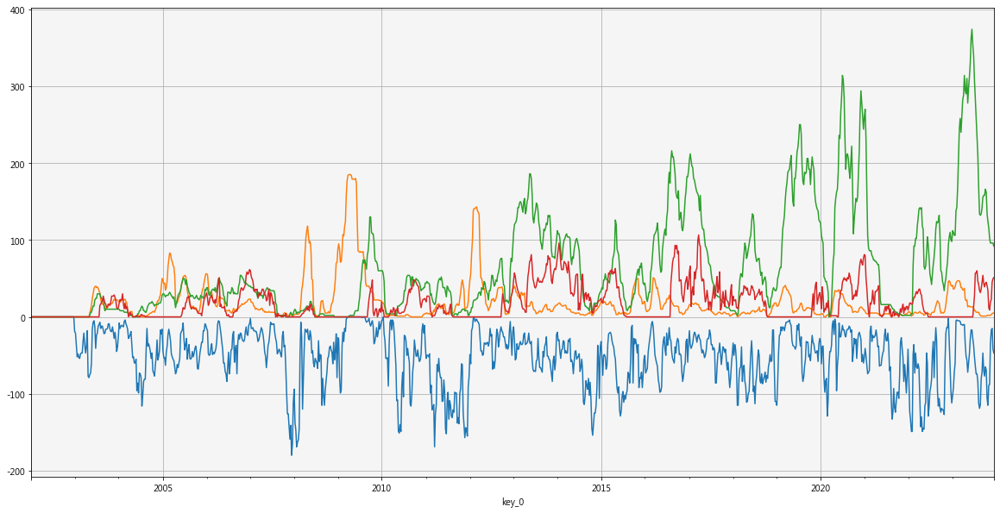

In [96]:
#(pz4*1).plot(figsize=(20, 10),grid = True)#關鍵點
pzs4.plot(figsize=(20, 10),grid = True)#放空
#(夏普部位*2).plot(figsize=(20, 10),grid = True)#強勢夏普
#(pvz4*0).plot(figsize=(20, 10),grid = True)#量能
KD部位.plot(figsize=(20, 10),grid = True)#低接
(MM部位*2).plot(figsize=(20, 10),grid = True)#融資
(外資4*1.5).plot(figsize=(20, 10),grid = True)#外資
#(MMstop部位*2).plot(figsize=(20, 10),grid = True)#X策略
#(spz4).plot(figsize=(20, 10),grid = True)#短勢短出關鍵點
plt.savefig('所有策略檔數')
plt.savefig(r'\\192.168.6.41\借券資料\週會圖\多空水位變化')

<AxesSubplot:xlabel='key_0'>

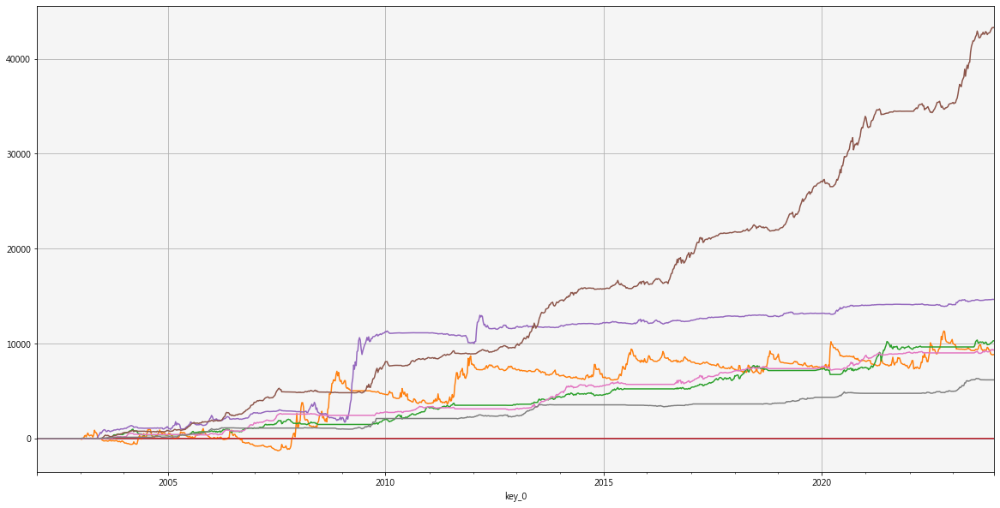

In [97]:
(trr.sort_index().sum(axis = 1).cumsum()*0).plot(figsize=(20, 10),grid = True)
trrs.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)
#(trr2330*20).sort_index().cumsum().plot()
(trrmsharpe.sort_index().sum(axis = 1).cumsum()*2).plot(figsize=(20, 10),grid = True)
(trrv*0).sort_index().sum(axis =1).cumsum().plot(figsize=(20, 10),grid = True)
trrkd.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)
(trrmm.sort_index().sum(axis = 1).cumsum()*2).plot(figsize=(20, 10),grid = True)
(trrtest*1.5).sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)
(trrmmstop.sort_index().sum(axis = 1).cumsum()*2).plot(figsize=(20, 10),grid = True)
#(strr.sort_index().sum(axis = 1).cumsum()*0.5).plot(figsize=(20, 10),grid = True)
#plt.savefig(r'\\192.168.6.41\借券資料\週會圖\多空水位變化')

# 淨部位變化

多空總部位 190.0


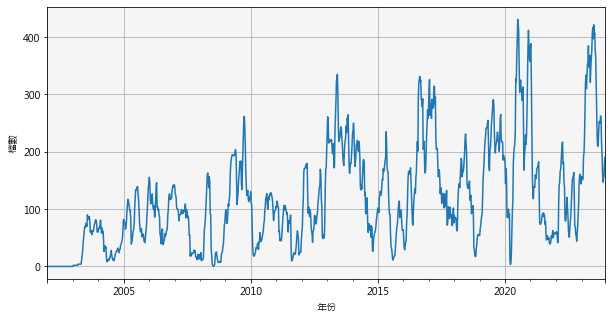

In [98]:
總部位變化 =  pz4*0 + (夏普部位*2)   +MM部位*2+ KD部位 + MMstop部位*2 + pvz4*0  +外資4*1.5
總部位變化.plot(figsize=(10, 5),grid = True)
print('多空總部位',總部位變化[當週日期])
plt.xlabel("年份")
plt.ylabel("檔數")
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\總部位水位變化')

In [99]:
總部位變化.tail(10)


key_0
2023-10-13    256.0
2023-10-20    214.5
2023-10-27    196.5
2023-11-03    164.0
2023-11-10    147.0
2023-11-17    153.5
2023-11-24    157.5
2023-12-01    181.0
2023-12-08    190.5
2023-12-15    190.0
dtype: float64

In [100]:
總部位變化.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\淨部位變化.xlsx')

# 混合策略損益

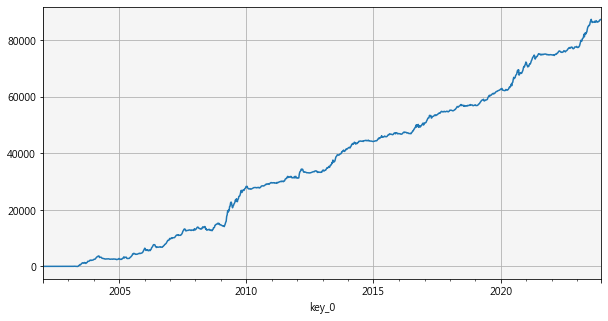

In [101]:
#所有策略加總 =  trrsp  + (trr.sort_index().sum(axis = 1).cumsum()) + (trrkd.sort_index().sum(axis = 1).cumsum()) \
# +(trrmm.sort_index().sum(axis = 1).cumsum())+tqt1*6+(trrmmstop.sort_index().sum(axis = 1).cumsum()) #++ trrtest.sort_index().sum(axis = 1).cumsum()+(trr2330*20)+ (trrv.sort_index().sum(axis = 1).cumsum())
#所有策略加總.plot(figsize=(20, 10),grid = True)
#plt.savefig("所有策略加總")
#修正後所有策略加總 =  trrsp  + (trr.sort_index().sum(axis = 1).cumsum())*0.5 + (trrkd.sort_index().sum(axis = 1).cumsum()) \
# +(trrmm.sort_index().sum(axis = 1).cumsum())*1.5+tqt1*6+(trrmmstop.sort_index().sum(axis = 1).cumsum())*3
#修正後所有策略加總.plot(figsize=(20, 10),grid = True)
修正後ETF所有策略加總 =  (trrspETF*1)*1  + (trr.sort_index().sum(axis = 1).cumsum())*0 + (trrkd.sort_index().sum(axis = 1).cumsum()) \
+(trrtest.sort_index().sum(axis = 1).cumsum())*1.5\
 +(trrmm.sort_index().sum(axis = 1).cumsum())*2+tqt1*2+(trrmmstop.sort_index().sum(axis = 1).cumsum())*2 +(trrv.sort_index().sum(axis = 1).cumsum())*0
修正後ETF所有策略加總.plot(figsize=(10, 5),grid = True)
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\全損益.png')
修正後ETF所有策略加總.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\全損益.xlsx')

# 歷年損益

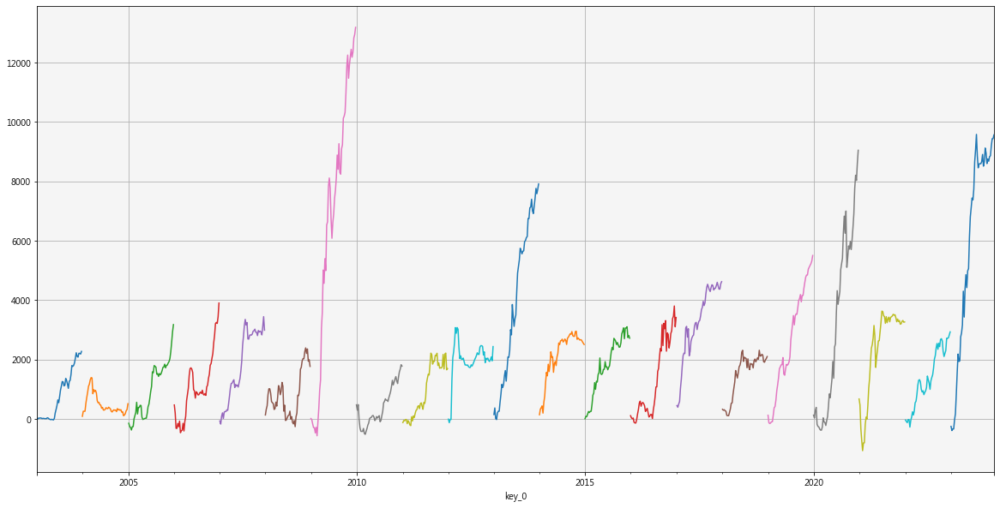

In [102]:
分年加總 = (trr.sort_index().sum(axis = 1))*0  + ((trrsETF*1).sort_index().sum(axis = 1)) \
+ (trrmsharpe.sort_index().sum(axis = 1))*2+ (trrkd.sort_index().sum(axis = 1)) + \
 (trrmm.sort_index().sum(axis = 1))*2 +(trrtest.sort_index().sum(axis = 1))*1.5 +(trrmmstop.sort_index().sum(axis = 1))*2 +(trrv.sort_index().sum(axis = 1))*0#+(strr.sort_index().sum(axis = 1))*0\
(分年加總['2003']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2004']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2005']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2006']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2007']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2008']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2009']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2010']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2011']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2012']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2013']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2014']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2015']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2016']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2017']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2018']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2019']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2020']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2021']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2022']*1).cumsum().plot(figsize=(20, 10),grid = True)
(分年加總['2023']*1).cumsum().plot(figsize=(20, 10),grid = True)



#plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\分年損益.png')
分年加總.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\分年資料.xlsx')

# 當年損益(數字)

In [103]:
分年加總['2023':].cumsum()

key_0
2023-01-06    -249.327356
2023-01-13    -389.143021
2023-01-20    -334.898597
2023-01-27    -334.898597
2023-02-03     -29.879915
2023-02-10     178.707390
2023-02-17     837.518510
2023-02-24    1545.621241
2023-03-03    2185.969736
2023-03-10    1937.099452
2023-03-17    1958.223975
2023-03-24    2763.969400
2023-03-31    2900.497653
2023-04-07    3171.579141
2023-04-14    4303.762011
2023-04-21    3432.578753
2023-04-28    4385.615560
2023-05-05    4860.087653
2023-05-12    4424.003176
2023-05-19    4988.279457
2023-05-26    5065.942243
2023-06-02    6114.276068
2023-06-09    6808.035693
2023-06-16    7117.146200
2023-06-23    7442.243449
2023-06-30    7377.506269
2023-07-07    7744.113636
2023-07-14    8657.107627
2023-07-21    9063.073937
2023-07-28    9584.314105
2023-08-04    8862.265895
2023-08-11    8457.771133
2023-08-18    8591.277799
2023-08-25    8597.216120
2023-09-01    8596.137235
2023-09-08    8668.386422
2023-09-15    8910.071138
2023-09-22    8514.386855
2023-0

<AxesSubplot:xlabel='key_0'>

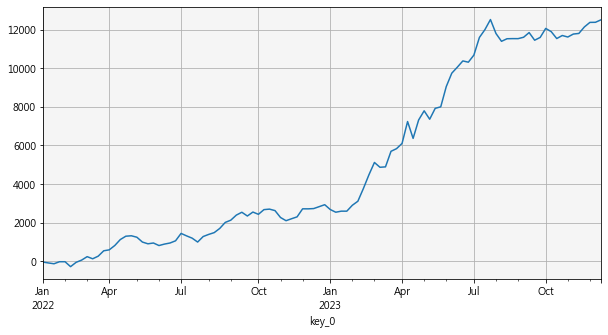

In [104]:
分年加總['2022':].cumsum().plot(figsize=(10, 5),grid = True)

# 前後比較

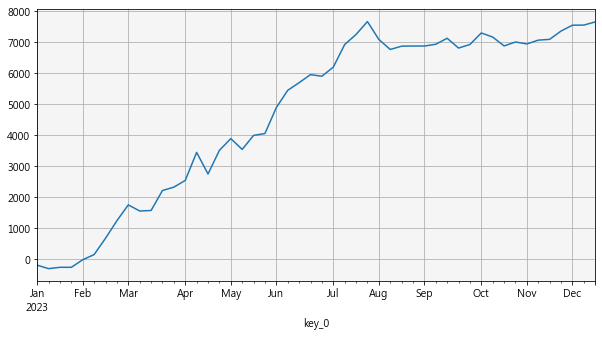

In [105]:
(分年加總['2023':]*0.8).cumsum().plot(figsize=(10, 5),grid = True)
#(trr['2023':].sort_index().sum(axis = 1).cumsum()).plot(figsize=(10, 5),grid = True)
plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\前後比較.png')

<AxesSubplot:xlabel='key_0'>

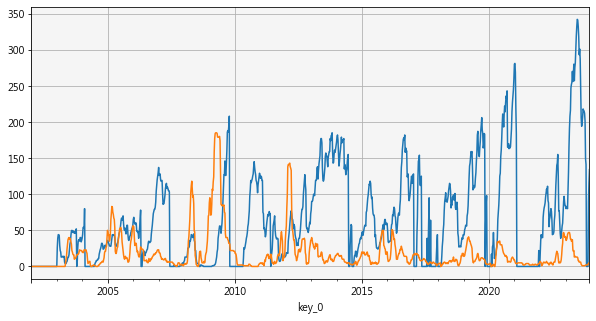

In [106]:
pz4.plot(figsize=(10, 5),grid = True)#關鍵點
#pzs4.plot()
#(夏普部位*6).plot()
#pvz4.plot()
KD部位.plot(figsize=(10, 5),grid = True)
#(MM部位*2).plot()
#plt.savefig(r'C:\Users\larryx30\larryx30\每週買賣報表\檔數交會.png')


# 當週彙總整理

In [107]:
#print("關鍵點買進標的")
#print(關鍵點買進)
#print("關鍵點買進檔數" , len(關鍵點買進))
#print("關鍵點賣出標的")
#print(關鍵點賣出)
#print("關鍵點賣出檔數" , len(關鍵點賣出))
print("M夏普買進標的")
print(M夏普買進)
print("M夏普買進檔數" , len(M夏普買進))
print("M夏普持有部位數目" , len(M夏普持有部位))
print("M夏普賣出標的")
print(M夏普賣出)
print("M夏普賣出檔數" , len(M夏普賣出))
print("量能買進標的")
#print(量能買進)
#print("量能買進檔數" , len(量能買進))
#print("量能持有部位數目" , len(量能持有部位))
#print("量能賣出標的")
#print(量能賣出)
#print("量能賣出檔數" , len(量能賣出))
print("低接買進標的")
print(低接買進)
print("低接買進檔數" , len(低接買進))
print("低接持有部位數目" , len(低接持有部位))
print("低接賣出標的")
print(低接賣出)
print("低接賣出檔數" , len(低接賣出))
print("融資爆發買進標的")
print(MM買進)
print("融資爆發買進檔數" , len(MM買進))
print("融資爆發持有部位數目" , len(MM持有部位))
print("融資爆發賣出標的")
print(MM賣出)
print("融資爆發賣出檔數" , len(MM賣出))
print("X買進標的")
print(MMstop買進)
print("X買進檔數" , len(MMstop買進))
print("X持有部位數目" , len(MMstop持有部位))
print("X賣出標的")
print(MMstop賣出)
print("X賣出檔數" , len(MMstop賣出))
print("外資買進標的")
print(外資買進)
print("外資買進檔數" , len(外資買進))
print("外資持有部位數目" , len(外資持有部位))
print("外資賣出標的")
print(外資賣出)
print("外資賣出檔數" , len(外資賣出))
print("空單放空標的")
print(空單放空)
print("空單放空檔數" , len(空單放空))
print("空單持有空單部位數目" , len(空單放空部位))
print("空單回補標的")
print(空單回補)
print("ETF空單放空標的")
print(ETF空單放空)
print("ETF空單放空檔數" , len(ETF空單放空))
print("ETF空單持有空單部位數目" , len(ETF空單放空部位))
print("ETF空單回補標的")
print(ETF空單回補)
print("強勢短出關鍵點買進標的")
#print(強勢短出關鍵點買進)
#print("強勢短出關鍵點買進檔數" , len(強勢短出關鍵點買進))
#print("強勢短出關鍵點持有部位數目" , len(強勢短出關鍵點持有部位))
#print("強勢短出關鍵點賣出標的")
#print(強勢短出關鍵點賣出)
#print("強勢短出關鍵點賣出檔數" , len(強勢短出關鍵點賣出))

M夏普買進標的
2548    1.0
Name: 2023-12-15 00:00:00, dtype: float64
M夏普買進檔數 1
M夏普持有部位數目 21
M夏普賣出標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
M夏普賣出檔數 0
量能買進標的
低接買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
低接買進檔數 0
低接持有部位數目 5
低接賣出標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
低接賣出檔數 0
融資爆發買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
融資爆發買進檔數 0
融資爆發持有部位數目 46
融資爆發賣出標的
5906    0.0
6281    0.0
Name: 2023-12-15 00:00:00, dtype: float64
融資爆發賣出檔數 2
X買進標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
X買進檔數 0
X持有部位數目 0
X賣出標的
Series([], Name: 2023-12-15 00:00:00, dtype: float64)
X賣出檔數 0
外資買進標的
1521    1.0
2347    1.0
3019    1.0
6156    1.0
6807    1.0
8426    1.0
Name: 2023-12-15 00:00:00, dtype: float64
外資買進檔數 6
外資持有部位數目 34
外資賣出標的
2233    0.0
3531    0.0
5225    0.0
6703    0.0
8442    0.0
Name: 2023-12-15 00:00:00, dtype: float64
外資賣出檔數 5
空單放空標的
2228   -1.0
2409   -1.0
3289   -1.0
3454   -1.0
3481   -1.0
3587   -1.0
4977   -1.0
6146   -1.0
61

# 持有部位表

In [108]:
pd.set_option('display.max_rows',None)
#print('關鍵點持有部位')
#print(list(關鍵點持有部位.index))
print('外資持有部位')
print(list(外資持有部位.index))
print('M夏普持有部位')
print(list(M夏普持有部位.index))
print('量能持有部位')
print(list(量能持有部位.index))
print('低接持有部位')
print(list(低接持有部位.index))
print('融資爆發持有部位')
print(list(MM持有部位.index))
print('X持有部位')
print(list(MMstop持有部位.index))
#print('空單持有部位')
#print(list(空單放空部位.index))
print('ETF空單持有部位')
print(list(ETF空單放空部位.index))
#print('強勢短出關鍵點持有部位')
#print(list(強勢短出關鍵點持有部位.index))


外資持有部位
['1229', '1521', '1532', '1722', '2006', '2029', '2347', '2374', '2441', '2451', '2496', '2520', '2548', '2636', '3015', '3019', '3086', '3213', '3413', '5471', '5534', '6156', '6189', '6683', '6807', '8163', '8271', '8426', '8467', '9911', '9917', '9924', '9933', '9938']
M夏普持有部位
['1519', '1713', '2211', '2385', '2449', '2493', '2539', '2546', '2548', '3005', '3017', '3078', '3702', '5469', '5536', '6189', '6191', '6197', '6201', '9927', '9930']
量能持有部位
['1339', '2365', '2385', '3122', '3530', '3548', '4908', '6139', '8054']
低接持有部位
['3122', '4148', '4167', '8341', '8938']
融資爆發持有部位
['1234', '1264', '1473', '1532', '1580', '1614', '1726', '2031', '2063', '2107', '2348', '2387', '2450', '2493', '2496', '2520', '2535', '2536', '2539', '2546', '2903', '3010', '3028', '3152', '3317', '3679', '4550', '4555', '4973', '5212', '5403', '5508', '5533', '6123', '6128', '6155', '6156', '6183', '6189', '6201', '6292', '6613', '8442', '9911', '9925', '9927']
X持有部位
[]
ETF空單持有部位
['1504', '1536', '

# 總操作股票檔數

In [109]:
總檔數 = len(MM持有部位) + len(外資持有部位) + len(M夏普持有部位) + len(低接持有部位) 
總檔數

106

# 育儀每週需求資料

In [110]:
import math
import datetime
育儀檔DF = pd.DataFrame()
育儀檔DF['ETF空單賣出標的'] = list(ETF空單放空.index)
lsws=[]
張數=[]
for i in range(len(育儀檔DF)):
    lsws.append(DDW[育儀檔DF.iloc[i,0]].tail(1).iloc[0,3])
育儀檔DF['ETF空單賣出收盤價'] = lsws
for l in range(len(育儀檔DF)):
    張數 = 2000000/(育儀檔DF['ETF空單賣出收盤價']*1000)
floormethod = lambda x :math.ceil(x)

try:
    育儀檔DF['需求張數'] = 張數.apply(floormethod)
    育儀檔DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\借券\ETF借券\每週ETF空單需求'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
    育儀檔DF.to_excel(r'\\192.168.6.41\借券資料\每週ETF空單需求'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
except:
    pass

In [111]:
import math
import datetime
育儀檔DF = pd.DataFrame()
育儀檔DF['空單賣出標的'] = list(空單放空.index)
lsws=[]
張數=[]
for i in range(len(育儀檔DF)):
    lsws.append(DDW[育儀檔DF.iloc[i,0]].tail(1).iloc[0,3])
育儀檔DF['空單賣出收盤價'] = lsws
for l in range(len(育儀檔DF)):
    張數 = 2000000/(育儀檔DF['空單賣出收盤價']*1000)
floormethod = lambda x :math.ceil(x)

try:
    育儀檔DF['需求張數'] = 張數.apply(floormethod)
    育儀檔DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\借券\全股票借券\每週空單需求'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
except:
    pass

# 每週買賣總表

In [112]:
每週買DF = pd.DataFrame()
#每週買DF = pd.concat([每週買DF,pd.DataFrame(關鍵點買進.index,columns = ['關鍵點買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(關鍵點賣出.index,columns = ['關鍵點賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(M夏普買進.index,columns = ['M夏普買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(M夏普賣出.index,columns = ['M夏普賣出'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(量能買進.index,columns = ['量能買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(量能賣出.index,columns = ['量能賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(低接買進.index,columns = ['低接買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(低接賣出.index,columns = ['低接賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(MM買進.index,columns = ['融資買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(MM賣出.index,columns = ['融資賣出'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(MMstop買進.index,columns = ['X買進'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(外資買進.index,columns = ['外資買進'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(外資賣出.index,columns = ['外資賣出'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(空單回補.index,columns = ['空單回補'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(空單回補.index,columns = ['空單回補'])],axis=1)
每週買DF = pd.concat([每週買DF,pd.DataFrame(ETF空單回補.index,columns = ['ETF空單回補'])],axis=1)
#每週買DF = pd.concat([每週買DF,pd.DataFrame(強勢短出關鍵點買進.index,columns = ['強勢短出關鍵點買進'])],axis=1)
每週買DF

,M夏普買進,低接買進,融資買進,X買進,外資買進,ETF空單回補
0,2548,NaN,NaN,NaN,1521,1605
1,NaN,NaN,NaN,NaN,2347,2206
2,NaN,NaN,NaN,NaN,3019,2337
3,NaN,NaN,NaN,NaN,6156,2634
4,NaN,NaN,NaN,NaN,6807,3003
5,NaN,NaN,NaN,NaN,8426,3056
6,NaN,NaN,NaN,NaN,NaN,5371
7,NaN,NaN,NaN,NaN,NaN,6196


In [113]:
import datetime

每週買DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\買進\每週買進總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [114]:
每週賣DF = pd.DataFrame()
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(關鍵點買進.index,columns = ['關鍵點買進'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(關鍵點賣出.index,columns = ['關鍵點賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(M夏普買進.index,columns = ['M夏普買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(M夏普賣出.index,columns = ['M夏普賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(量能買進.index,columns = ['量能買進'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(量能賣出.index,columns = ['量能賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(低接買進.index,columns = ['低接買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(低接賣出.index,columns = ['低接賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MM買進.index,columns = ['融資買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MM賣出.index,columns = ['融資賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(外資買進.index,columns = ['外資買進'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(MMstop賣出.index,columns = ['X賣出'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(外資賣出.index,columns = ['外資賣出'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(空單放空.index,columns = ['空單放空'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(空單放空.index,columns = ['空單放空'])],axis=1)
每週賣DF = pd.concat([每週賣DF,pd.DataFrame(ETF空單放空.index,columns = ['ETF空單放空'])],axis=1)
#每週賣DF = pd.concat([每週賣DF,pd.DataFrame(強勢短出關鍵點賣出.index,columns = ['強勢短出關鍵點賣出'])],axis=1)
每週賣DF


,M夏普賣出,低接賣出,融資賣出,X賣出,外資賣出,ETF空單放空
0,NaN,NaN,5906,NaN,2233,2409
1,NaN,NaN,6281,NaN,3531,3454
2,NaN,NaN,NaN,NaN,5225,3481
3,NaN,NaN,NaN,NaN,6703,3587
4,NaN,NaN,NaN,NaN,8442,4977
5,NaN,NaN,NaN,NaN,NaN,6146
6,NaN,NaN,NaN,NaN,NaN,6188
7,NaN,NaN,NaN,NaN,NaN,8050
8,NaN,NaN,NaN,NaN,NaN,8069
9,NaN,NaN,NaN,NaN,NaN,8358


In [115]:
每週賣DF.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\賣出\每週賣出總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [116]:
# try:
#    !jupyter nbconvert --to python SQL週資料轉化.ipynb
# python即转化为.py，script即转化为.html
# file_name.ipynb即当前module的文件名
# except:
#     pass

# 權重損益

In [117]:
部位 = pd.DataFrame(總部位變化)

In [118]:
部位['權重'] = np.where(總部位變化 <500, 1, 500/總部位變化) 

In [119]:
部位.tail(10)

,0,權重
key_0,,
2023-10-13,256.0,1.0
2023-10-20,214.5,1.0
2023-10-27,196.5,1.0
2023-11-03,164.0,1.0
2023-11-10,147.0,1.0
2023-11-17,153.5,1.0
2023-11-24,157.5,1.0
2023-12-01,181.0,1.0
2023-12-08,190.5,1.0


<AxesSubplot:xlabel='key_0'>

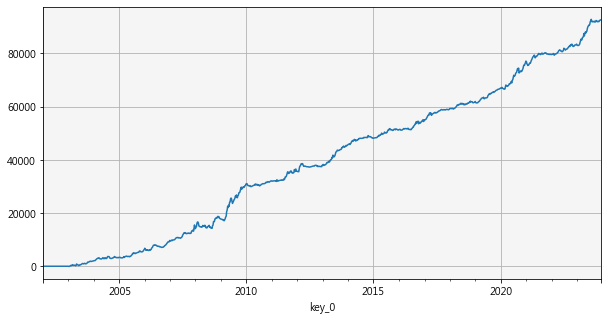

In [120]:
權重關鍵 = trr.sort_index().sum(axis = 1)*0*部位['權重']
權重放空 = trrs.sort_index().sum(axis = 1)
權重低接 = trrkd.sort_index().sum(axis = 1)*部位['權重']
權重融資 = trrmm.sort_index().sum(axis = 1)*2*部位['權重']
權重X = trrmmstop.sort_index().sum(axis = 1)*2*部位['權重']
權重夏普 = trrmsharpe.sort_index().sum(axis = 1)*2*部位['權重']
#權重短出 =  (strr.sort_index().sum(axis = 1))*0*部位['權重']
權重外資 = (trrtest.sort_index().sum(axis = 1))*1.5*部位['權重']
權重量能 = (trrv.sort_index().sum(axis = 1))*0*部位['權重']
權重加總 = 權重關鍵 + 權重放空 + 權重低接 + 權重融資 + 權重X + 權重夏普  + 權重外資 + 權重量能#+ 權重短出
#權重關鍵.cumsum().plot()
#權重放空.cumsum().plot()
#權重低接.cumsum().plot()
#權重融資.cumsum().plot()
權重加總.cumsum().plot(figsize = (10,5),grid = True)
#所有策略加總.plot()

<AxesSubplot:xlabel='key_0'>

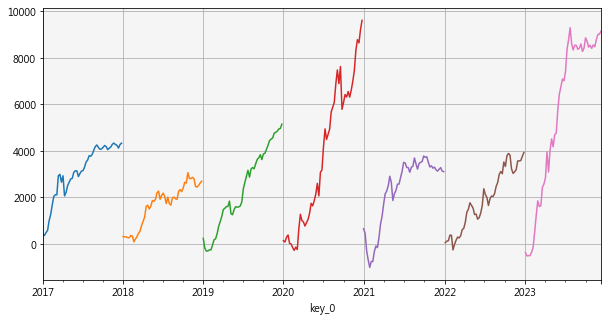

In [121]:
權重加總['2017'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2018'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2019'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2020'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2021'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2022'].cumsum().plot(figsize=(10, 5),grid = True)
權重加總['2023'].cumsum().plot(figsize=(10, 5),grid = True)

# 個股權重檢查表

In [122]:
from collections import defaultdict

def zero():
    return 0

dict = defaultdict(zero)

#if len(關鍵點持有部位) !=0:
    #for i in 關鍵點持有部位.index:
        #dict[i] += 關鍵點持有部位.loc[i]*0
if len(M夏普持有部位) !=0:
    for i in M夏普持有部位.index:
        dict[i] += M夏普持有部位.loc[i]*2
if len(低接持有部位) !=0:
    for i in 低接持有部位.index:
        dict[i] += 低接持有部位.loc[i]*1
if len(MM持有部位) !=0:
    for i in MM持有部位.index:
        dict[i] += MM持有部位.loc[i]*2
if len(MMstop持有部位) !=0:
    for i in MMstop持有部位.index:
        dict[i] += MMstop持有部位.loc[i]*2
#if len(強勢短出關鍵點持有部位) !=0:
    #for i in 強勢短出關鍵點持有部位.index:
        #dict[i] += 強勢短出關鍵點持有部位.loc[i]*0
#if len(量能持有部位) !=0:
    #for i in 量能持有部位.index:
        #dict[i] += 量能持有部位.loc[i]*0
if len(外資持有部位) !=0:
    for i in 外資持有部位.index:
        dict[i] += 外資持有部位.loc[i]*1.5

# 星期一權重表匯出

In [123]:
權重部位比對表 = pd.DataFrame.from_dict(dict,orient='index').sort_index().rename(columns = {0:'部位'})
權重部位比對表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重部位比對表\權重部位比對表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
if datetime.datetime.now().weekday() == 5:
    權重部位比對表.to_excel(r'Z:\期貨自營\理論權重\權重部位比對表.xlsx')
#權重部位比對表

In [124]:
權重部位比對表['部位'].cumsum().tail(10)

8467    171.5
8938    172.5
9911    176.0
9917    177.5
9924    179.0
9925    181.0
9927    185.0
9930    187.0
9933    188.5
9938    190.0
Name: 部位, dtype: float64

# 買進權重表

In [125]:
from collections import defaultdict

def zero():
    return 0

dictb = defaultdict(zero)

#if len(關鍵點買進) !=0:
    #for i in 關鍵點買進.index:
        #dictb[i] += 關鍵點買進.loc[i]*0
if len(外資買進) !=0:
    for i in 外資買進.index:
        dictb[i] +=外資買進.loc[i]*1.5
if len(M夏普買進) !=0:
    for i in M夏普買進.index:
        dictb[i] += M夏普買進.loc[i]*2
if len(低接買進) !=0:
    for i in 低接買進.index:
        dictb[i] += 低接買進.loc[i]*1
if len(MM買進) !=0:
    for i in MM買進.index:
        dictb[i] += MM買進.loc[i]*2
if len(MMstop買進) !=0:
    for i in MMstop買進.index:
        dictb[i] += MMstop買進.loc[i]*2
#if len(強勢短出關鍵點買進) !=0:
    #for i in 強勢短出關鍵點買進.index:
        #dictb[i] += 強勢短出關鍵點買進.loc[i]*0
#if len(量能買進) !=0:
    #for i in 量能買進.index:
        #dictb[i] += 量能買進.loc[i]*0

In [126]:
權重買進部位表 = pd.DataFrame.from_dict(dictb,orient='index').sort_index().rename(columns = {0:'買進部位'})
權重買進部位表 = 權重買進部位表.sort_values(by = ['買進部位'])
權重買進部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重買進\權重買進部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
print(權重買進部位表)
print('買進總金額',int(權重買進部位表['買進部位'].sum()*100),'萬')

      買進部位
1521   1.5
2347   1.5
3019   1.5
6156   1.5
6807   1.5
8426   1.5
2548   2.0
買進總金額 1100 萬


In [127]:
from collections import defaultdict

def zero():
    return 0

dicts = defaultdict(zero)

#if len(關鍵點賣出) !=0:
    #for i in 關鍵點賣出.index:
        #dicts[i] += 關鍵點賣出.loc[i]-0
if len(外資賣出) !=0:
    for i in 外資賣出.index:
        dicts[i] += 外資賣出.loc[i]-1.5
if len(M夏普賣出) !=0:
    for i in M夏普賣出.index:
        dicts[i] += M夏普賣出.loc[i]-2
if len(低接賣出) !=0:
    for i in 低接賣出.index:
        dicts[i] += 低接賣出.loc[i]-1
if len(MM賣出) !=0:
    for i in MM賣出.index:
        dicts[i] += MM賣出.loc[i]-2
if len(MMstop賣出) !=0:
    for i in MMstop賣出.index:
        dicts[i] += MMstop賣出.loc[i]-2
#if len(強勢短出關鍵點賣出) !=0:
    #for i in 強勢短出關鍵點賣出.index:
        #dicts[i] += 強勢短出關鍵點賣出.loc[i]-0
#if len(量能賣出) !=0:
    #for i in 量能賣出.index:
        #dicts[i] += 量能賣出.loc[i]-0

In [128]:
if not pd.DataFrame.from_dict(dicts,orient='index').sort_index().empty:
    權重賣出部位表 = pd.DataFrame.from_dict(dicts,orient='index').sort_index().rename(columns = {0:'賣出部位'})
    權重賣出部位表 = 權重賣出部位表.sort_values(by = ['賣出部位'],ascending=False)
    權重賣出部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重賣出\權重賣出部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
    print(權重賣出部位表)
    print("賣出總金額",int(權重賣出部位表['賣出部位'].sum()*100),'萬')
else:
    權重賣出部位表 = pd.DataFrame()
    權重賣出部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重賣出\權重賣出部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
    print("沒有需賣出部位")

      賣出部位
2233  -1.5
3531  -1.5
5225  -1.5
6703  -1.5
8442  -1.5
5906  -2.0
6281  -2.0
賣出總金額 -1150 萬


In [129]:
#權重賣出部位表 = pd.DataFrame.from_dict(dicts,orient='index').sort_index().rename(columns = {0:'賣出部位'})
#權重賣出部位表 = 權重賣出部位表.sort_values(by = ['賣出部位'],ascending=False)
#權重賣出部位表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\權重賣出\權重賣出部位表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')
#print(權重賣出部位表)
#print("賣出總金額",int(權重賣出部位表['賣出部位'].sum()*100),'萬')


# 每日買賣總表

In [130]:
每日買賣總表 = pd.concat([權重買進部位表.reset_index(drop = False).rename(columns = {'index':'買進部位'}),權重賣出部位表.reset_index(drop = False).rename(columns = {'index':'賣出部位'})],axis =1)
每日買賣總表
每日買賣總表.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\每日買賣總表\每日買賣總表'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

# 部位查詢檔

In [131]:
print(權重部位比對表['部位'][權重部位比對表['部位'] >= 3])
print(len(權重部位比對表['部位'][權重部位比對表['部位'] >= 3]))
print((權重部位比對表['部位'][權重部位比對表['部位'] >= 3]).cumsum())

1532    3.5
2493    4.0
2496    3.5
2520    3.5
2539    4.0
2546    4.0
2548    3.5
6156    3.5
6189    5.5
6201    4.0
9911    3.5
9927    4.0
Name: 部位, dtype: float64
12
1532     3.5
2493     7.5
2496    11.0
2520    14.5
2539    18.5
2546    22.5
2548    26.0
6156    29.5
6189    35.0
6201    39.0
9911    42.5
9927    46.5
Name: 部位, dtype: float64


# 淨買賣超金額

In [ ]:
買進金額 = 權重買進部位表['買進部位'].sum()*100
賣出金額 = 權重賣出部位表['賣出部位'].sum()*100
淨買賣超金額 = 買進金額 + 賣出金額
print(int(淨買賣超金額),'萬')


In [ ]:
#DDW['5234'].tail(20)

# ESG部位整理

In [ ]:
#dfesg = pd.read_excel(r'\\192.168.1.230\新金部\07個人\larryx30\ESG部位\持有部位表.xlsx')

In [ ]:
#ls_date = list(set(dfesg['日期']))


In [ ]:
#list(set(dfesg['日期']))

In [ ]:
#ls_date.sort()

In [ ]:
#ls_date_now_have = ls_date[-25:]

In [ ]:
#ls_date_now_have

In [ ]:
#dfesg[dfesg['日期'].isin(ls_date_now_have)].groupby("多單")['多單權重'].sum().reset_index(drop = False)

In [ ]:
#多單 = pd.DataFrame(dfesg[dfesg['日期'].isin(ls_date_now_have)].groupby("多單")['多單權重'].sum()).reset_index(drop = False)

In [ ]:
#空單	 = pd.DataFrame(dfesg[dfesg['日期'].isin(ls_date_now_have)].groupby("空單")['借券張數'].sum()).reset_index(drop = False)

In [ ]:
#df_all = pd.concat([多單,空單],axis = 1)

In [ ]:
#df_all['日期'] = ls_date[-1]

In [ ]:
#df_all = df_all.set_index('日期').reset_index(drop = False)

In [ ]:
#df_all

In [ ]:
#df_all.to_excel(r'C:\Users\larryx30\larryx30\每週買賣報表\ESG部位\ESG部位'+datetime.datetime.today().strftime('%Y-%m-%d')+'.xlsx')

In [ ]:
#DDW['4533']['MMBUY'].tail(30)

# 測試用部位

In [ ]:
# import talib
# ERRORTTT = []
# trrTTT = pd.DataFrame()
# pzTTT = pd.DataFrame()

# for x in tqdm(SKTCRI):
    
#     DDW[str(x)]['TTTMAX52'] = DDW[str(x)]["還原收盤價"].rolling(52).max()
#     DDW[str(x)]["TTTMAX52S"] = DDW[str(x)]["TTTMAX52"].shift(1)
#     DDW[str(x)]["TTT4MA"] = talib.MA(DDW[str(x)]["還原收盤價"].dropna(), timeperiod=5, matype=0)
#     DDW[str(x)]["TTT4MAS"] = DDW[str(x)]["4MA"].shift(1)
#     DDW[str(x)]["DR"] = ((DDW[str(x)]["還原收盤價"] - DDW[str(x)]["還原收盤價"].shift(1))/DDW[str(x)]["還原收盤價"].shift(1))*100
#     DDW[str(x)]['大盤夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
#     DDW[str(x)]['一籃子夏普']= DDW['TWA00']['sharpe'].fillna(method = 'pad',axis =0)
#     TTTKPBS = 0
#     TTTKPBUY =[]
#     for z in range(len(DDW[str(x)])):

#         if DDW[str(x)]["還原收盤價"].iloc[z]  > DDW[str(x)]["TTTMAX52S"].iloc[z]  :
        
#             TTTKPBS = 1

#         elif DDW[str(x)]["TTT4MA"].iloc[z] < DDW[str(x)]["TTT4MAS"].iloc[z] or DDW[str(x)]['週轉率(%)'].iloc[z] > 15 :
#             TTTKPBS = 0
#             #buy.append("0")
#         TTTKPBUY.append(TTTKPBS)
#     DDW[str(x)]["TTTBUY"] = TTTKPBUY
#     DDW[str(x)]["TTTBUYS"] = DDW[str(x)]["TTTBUY"].shift(1)
#     TTTpzb = DDW[str(x)]["TTTBUYS"]  
#     TTTpzb.name = str(x)
#     TTTpzbs = DDW[str(x)]["TTTBUY"]
#     TTTpzbs.name = str(x)
#     DDW[str(x)]["TTTRR"] = DDW[str(x)]["DR"] * DDW[str(x)]["TTTBUYS"].dropna().astype(int)
#     TTTPT = DDW[str(x)]["TTTRR"]
#     TTTPT.name = str(x)
#     if len(trrTTT) == 0:
#         trrTTT = TTTPT
#     else:
#         trrTTT = pd.merge(trrTTT,TTTPT,left_on = trrTTT.index,right_on = TTTPT.index,how = 'outer')
#         trrTTT.set_index('key_0',inplace = True)
#     if len(pzTTT) == 0:
#         pzTTT = TTTpzbs
#     else:
#         pzTTT = pd.merge(pzTTT,TTTpzbs,left_on = pzTTT.index,right_on = TTTpzbs.index,how = 'outer')
#         pzTTT.set_index('key_0',inplace = True)

# trrbTTT =trrTTT.sort_index().sum(axis = 1).cumsum().plot(figsize=(20, 10),grid = True)

# plt.xlabel("time")
# plt.ylabel("Profit")


In [ ]:
# 測試持有部位 = pzTTT.loc[當週日期][(pzTTT.loc[當週日期]==1)]
# 測試買進 = pzTTT.loc[當週日期][(pzTTT.loc[當週日期]==1) & (pzTTT.loc[前週日期]==0)]
# 測試賣出 = pzTTT.loc[當週日期][(pzTTT.loc[當週日期]==0) & (pzTTT.loc[前週日期]==1)]
# print("測試買進標的")
# print(測試買進)
# print("測試買進檔數" , len(測試買進))
# print("測試持有部位數目" , len(測試持有部位))
# print("測試賣出部位")
# print(測試賣出)
# print("測試賣出檔數" , len(測試賣出))